In [36]:
#!/usr/bin/env python
import sys, math
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
import numpy as np
import glob
import random

import aux
import data_classes as dc
import myplot as mypl
import physics as ph

inputpath = aux.COMMON_INPUT_PATH
outputpath = aux.COMMON_OUTPUT_PATH
dirLabel = mypl.dirLabel
muondatapath = aux.MUON_DATA_PATH
print(muondatapath)

%load_ext autoreload
%autoreload 2


/eos/user/l/lrygaard/ttalp/ttj_cluster_runs/
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Plot setups
massLabels = [r"$m_a=300\,$MeV",r"$m_a=1\,$GeV",r"$m_a=10\,$GeV",r"$m_a=50\,$GeV"]
masses = [0.3,1,10,50]
labels_ttj = [r'$t\bar{t}j$ muon pairs',r'$t\bar{t}j$ muon non-pairs',r'$t\bar{t}j$ same sign muon',r'$t\bar{t}j$ single muon']

intlumi = 150*1000 #pb-1

# cross-sections in pb
cross_incl_all = [0.08800288, 0.0878576, 0.0923017, 0.09592004, 0.09589373000000001, 
                  0.09378335999999998, 0.08844931999999998, 0.08216535999999999, 0.06951777000000002, 
                  0.04509247499999999]
cross_incl = []
cross_incl.append(cross_incl_all[1]) # 300 MeV
cross_incl.append(cross_incl_all[2]) # 1 GeV
cross_incl.append(cross_incl_all[5]) # 10 GeV
cross_incl.append(cross_incl_all[8]) # 50 GeV
cross_ttj = [233.923699]

N_incl = []
for i in range(len(masses)):
    N_incl.append(100000)
N_ttj = [100*100000]

# dark blue, light blue, green, light green, yellow, orange, red, pink
#colors = [(0/256, 114/256, 178/256, 1),(86/256, 180/256, 223/256, 1),(0/256, 158/256, 115/256, 1),(144/256, 238/256, 144/256, 1),(240/256, 228/256, 66/256, 1),(230/256, 159/256, 0/256, 1),(215/256, 94/256, 0/256, 1),(204/256, 121/256, 167/256, 1)]
# dark blue, light blue, green, yellow, orange, red, pink
#colors = [(0/256, 114/256, 178/256, 1),(86/256, 180/256, 223/256, 1),(0/256, 158/256, 115/256, 1),(240/256, 228/256, 66/256, 1),(230/256, 159/256, 0/256, 1),(215/256, 94/256, 0/256, 1),(204/256, 121/256, 167/256, 1)]
# dark blue, green, orange, yellow, red, pink
colors = [(0/256, 114/256, 178/256, 1),(0/256, 158/256, 115/256, 1),(230/256, 159/256, 0/256, 1),(240/256, 228/256, 66/256, 1),(215/256, 94/256, 0/256, 1),(204/256, 121/256, 167/256, 1)]


# Functions

In [10]:
def get_expected_events(datasets, cross_sections, intlumi, N_tot):
    if len(datasets) != len(cross_sections):
        print("Error: len(datasets) != len(cross_sections)")
    if len(datasets) != len(N_tot):
        print("Error: len(datasets) != len(N_tot)")
    else:
        for i in range(len(datasets)):
            n = len(datasets[i].events)*cross_sections[i]*intlumi/N_tot[i]
            sigma_n = math.sqrt(len(datasets[i].events))*cross_sections[i]*intlumi/N_tot[i]             
            print("Expected number of events: ", n, " +- ", sigma_n)
            
def get_figure_of_merit(signal, signal_cross, signal_N, background, background_cross, background_N, intlumi):
    nS = len(signal.events)*signal_cross*intlumi/signal_N
    nB = 0
    sigmaB2 = 0
    for i in range(len(background)):
        nB += len(background[i].events)*background_cross[i]*intlumi/background_N[i]
        sigmaBi = math.sqrt(len(background[i].events))*background_cross[i]*intlumi/background_N[i]
        sigmaB2 += sigmaBi*sigmaBi
    sigmaB = math.sqrt(sigmaB2)
    s = nS/math.sqrt(nS+nB+sigmaB)
    return s

# Particle Ancestors
The following calculations, functions and plots are outdated, but still remaining in case we want to reuse it later

# Particle widths
Given in keV

In [2]:
t = 142e3 # 6

# Light unflavoured mesons
eta = 1.31 # 221
etap = 0.188e3 # 331
rho = 147.4e3 # 113  neutral only, e+e-
omega = 8.68e3 # 223
phi = 4.25e3 # 333
a10 = 600e3 # 20213 full width 250 to 600 MeV

# charmed mesons

dasteriskplus = 83.4 # 413
dasteriskzero = 2.1e3 # 423 less than with CL=90%
dsasteriskplus = 1.9e3 # 433 less than with CL=90%
jpsi = 92.6 # 443
psi2S = 294 # 100443
chic1 = 0.84e3 # 20443
chic0 = 10.8e3 # 10441
chic2 = 1.97e3 # 445

# bottom mesons
upsilon = 54.02 # 553
basterisksplus = 1.9e3 # 433 less than with CL=90%

# baryons
sigmabasteriskplus = 9.4e3 # 5224


# Particle mean life
Given in s

In [3]:
tau = 2.903e-13 # 15

# charmed mesons
dplus = 1.033e-12 # 411
dzero = 4.103e-13 # 421
dsplus = 504e-15 # 431

# bottom mesons
bplus = 1.638e-12 # 521
bzero = 1.519e-12 # 511
bszero = 1.520e-12 # 531

# baryons
sigmaminus = 1.479e-10 # 3112
lambda_ = 2.632e-10 # 3122
ximinus = 1.639e-10 # 3312
xizero = 2.90e-10 # 3322
xiczero = 1.519e-13 # 4132
xicplus = 4.53e-13 # 4232
lambdacplus = 201.5e-15 # 4122
omegaczero = 2.68e-13 # 4332
lambdabzero = 1.471e-12 # 5122
xibminus = 1.572e-12 # 5132
xibzero = 1.480e-12 # 5232


In [4]:
# for time given in s
# returns decay length in cm
def get_decaylength_from_time(time):
    c = 299792458 # m/s
    return time*c*100

In [5]:
# for width given in keV
# returns decay length in cm
def get_decaylength_from_width(width):
    c = 299792458 # m/s
    hbar = 6.582119569e-16 #eV s
    hbar = hbar/1000 # keV s
    return (hbar*c/width)*100

# for width given in keV
# returns lifetime given in s
def get_tau_from_width(width):
    hbar = 6.582119569e-16 #eV s
    hbar = hbar/1000 # keV s
    return (hbar/width)

In [6]:
decay_lengths = dict()

# All except the photons now (22) ...
decay_lengths.update({0:0})
decay_lengths.update({6:get_decaylength_from_width(t)})
decay_lengths.update({15:get_decaylength_from_time(tau)})
decay_lengths.update({113:get_decaylength_from_width(rho)})
decay_lengths.update({221:get_decaylength_from_width(eta)})
decay_lengths.update({223:get_decaylength_from_width(omega)})
decay_lengths.update({331:get_decaylength_from_width(etap)})
decay_lengths.update({333:get_decaylength_from_width(phi)})
decay_lengths.update({411:get_decaylength_from_time(dplus)})
decay_lengths.update({421:get_decaylength_from_time(dzero)})
decay_lengths.update({431:get_decaylength_from_time(dsplus)})
decay_lengths.update({433:get_decaylength_from_width(dsasteriskplus)})
decay_lengths.update({443:get_decaylength_from_width(jpsi)})
decay_lengths.update({445:get_decaylength_from_width(chic2)})
decay_lengths.update({511:get_decaylength_from_time(bzero)})
decay_lengths.update({521:get_decaylength_from_time(bplus)})
decay_lengths.update({531:get_decaylength_from_time(bszero)})
decay_lengths.update({553:get_decaylength_from_width(upsilon)})
decay_lengths.update({3112:get_decaylength_from_time(sigmaminus)})
decay_lengths.update({3122:get_decaylength_from_time(lambda_)})
decay_lengths.update({3312:get_decaylength_from_time(ximinus)})
decay_lengths.update({3322:get_decaylength_from_time(xizero)})
decay_lengths.update({4122:get_decaylength_from_time(lambdacplus)})
decay_lengths.update({4132:get_decaylength_from_time(xiczero)})
decay_lengths.update({4232:get_decaylength_from_time(xicplus)})
decay_lengths.update({4332:get_decaylength_from_time(omegaczero)})
decay_lengths.update({5122:get_decaylength_from_time(lambdabzero)})
decay_lengths.update({5132:get_decaylength_from_time(xibminus)})
decay_lengths.update({5232:get_decaylength_from_time(xibzero)})
decay_lengths.update({10441:get_decaylength_from_width(chic0)})
decay_lengths.update({20213:get_decaylength_from_width(a10)})
decay_lengths.update({20443:get_decaylength_from_width(chic1)})
decay_lengths.update({100443:get_decaylength_from_width(psi2S)})
print(decay_lengths)
print(len(decay_lengths))

taus = dict()

# All except the photons now (22) ...
taus.update({0:0})
taus.update({6:get_tau_from_width(t)})
taus.update({15:tau})
taus.update({113:get_tau_from_width(rho)})
taus.update({221:get_tau_from_width(eta)})
taus.update({223:get_tau_from_width(omega)})
taus.update({331:get_tau_from_width(etap)})
taus.update({333:get_tau_from_width(phi)})
taus.update({411:dplus})
taus.update({421:dzero})
taus.update({431:dsplus})
taus.update({433:get_tau_from_width(dsasteriskplus)})
taus.update({443:get_tau_from_width(jpsi)})
taus.update({445:get_tau_from_width(chic2)})
taus.update({511:bzero})
taus.update({521:bplus})
taus.update({531:bszero})
taus.update({553:get_tau_from_width(upsilon)})
taus.update({3112:sigmaminus})
taus.update({3122:lambda_})
taus.update({3312:ximinus})
taus.update({3322:xizero})
taus.update({4122:lambdacplus})
taus.update({4132:xiczero})
taus.update({4232:xicplus})
taus.update({4332:omegaczero})
taus.update({5122:lambdabzero})
taus.update({5132:xibminus})
taus.update({5232:xibzero})
taus.update({10441:get_tau_from_width(chic0)})
taus.update({20213:get_tau_from_width(a10)})
taus.update({20443:get_tau_from_width(chic1)})
taus.update({100443:get_tau_from_width(psi2S)})

print(taus)
print(len(taus))

{0: 0, 6: 1.3896266228453595e-13, 15: 0.00870297505574, 113: 1.3387176420898309e-13, 221: 1.5063128278171074e-08, 223: 2.273352309263146e-12, 331: 1.0496115981066014e-10, 333: 4.642987775153908e-12, 411: 0.0309685609114, 421: 0.012300484551739998, 431: 0.0151095398832, 433: 1.0385630549686371e-11, 443: 2.13096091192269e-10, 445: 1.0016597992083304e-11, 511: 0.045538474370200005, 521: 0.049106004620400004, 531: 0.045568453616, 553: 3.652850433988172e-10, 3112: 4.43393045382, 3122: 7.890537494559998, 3312: 4.91359838662, 3322: 8.693981282, 4122: 0.0060408180287, 4132: 0.00455384743702, 4232: 0.013580598347399999, 4332: 0.0080344378744, 5122: 0.044099470571800005, 5132: 0.047127374397599994, 5232: 0.044369283784, 10441: 1.827101670778158e-12, 20213: 3.2887830074006846e-14, 20443: 2.3491307195719175e-11, 100443: 6.711802055919763e-11}
33
{0: 0, 6: 4.635295471126761e-24, 15: 2.903e-13, 113: 4.46548139009498e-24, 221: 5.024518754961832e-19, 223: 7.583087061059908e-23, 331: 3.501127430319149e

{0: 0, 6: 172.69, 15: 1.77686, 113: 0.77526, 221: 0.547862, 223: 0.78266, 331: 0.95778, 333: 1.019461, 411: 1.86966, 421: 1.86484, 431: 1.96835, 443: 3.0969, 511: 5.27966, 521: 5.27934, 531: 5.36692, 553: 9.4603, 3112: 1.197449, 3122: 1.115683, 3312: 1.32171, 3322: 1.31486, 4122: 2.28646, 4132: 2.47044, 4232: 2.46771, 4332: 2.6952, 5122: 5.6196, 5132: 5.797, 5232: 5.7919, 100443: 3.6861}
28
[0, 172.69, 1.77686, 0.77526, 0.547862, 0.78266, 0.95778, 1.019461, 1.86966, 1.86484, 1.96835, 3.0969, 5.27966, 5.27934, 5.36692, 9.4603, 1.197449, 1.115683, 1.32171, 1.31486, 2.28646, 2.47044, 2.46771, 2.6952, 5.6196, 5.797, 5.7919, 3.6861]


Text(0.5, 0, 'Mass [GeV]')

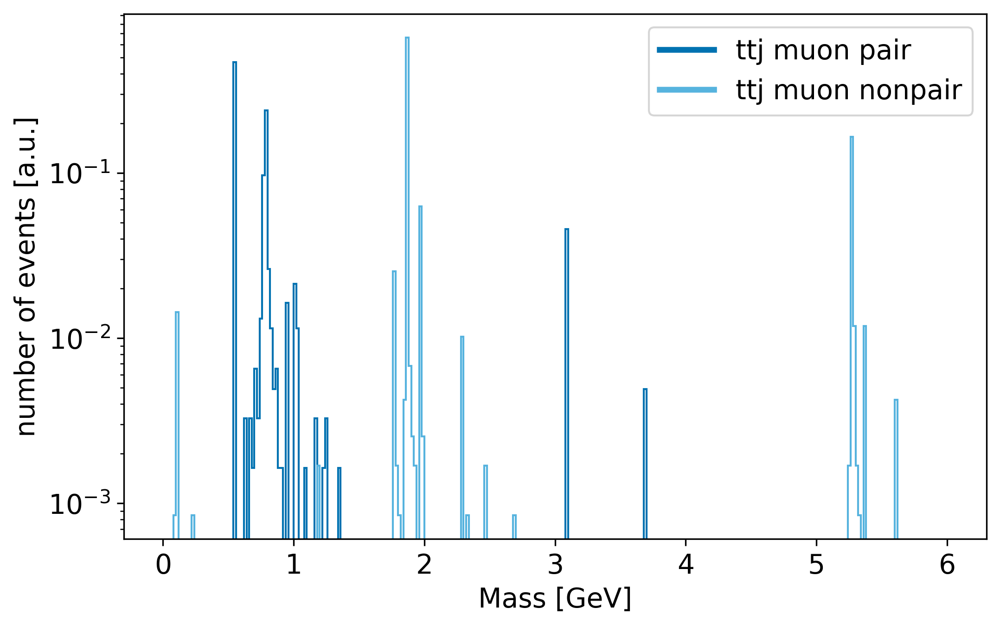

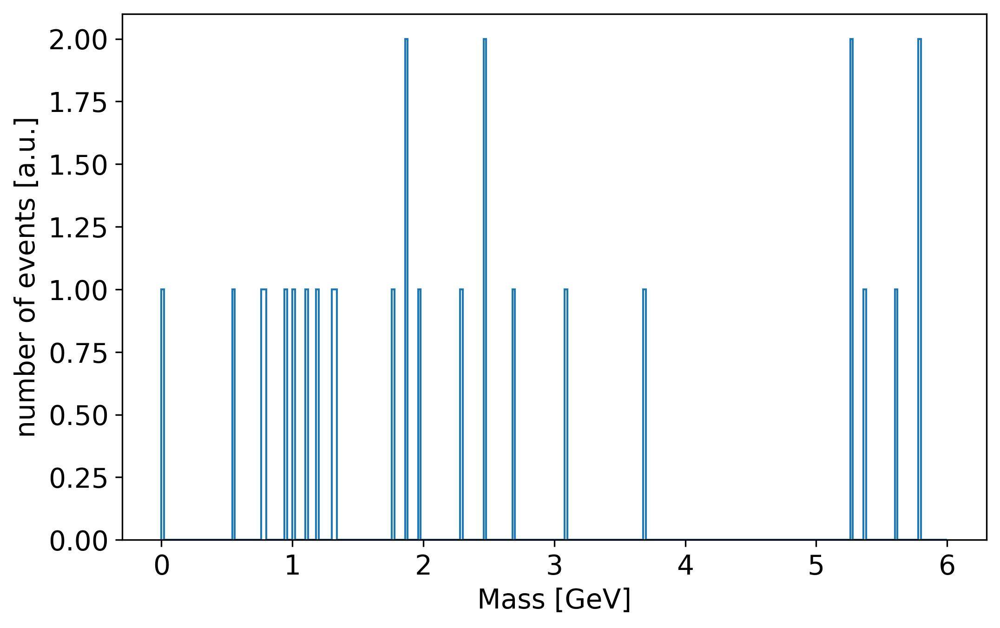

In [51]:
data_ttj_pair = data_ttj_pair_e
data_ttj_nonpair = data_ttj_nonpair_e

labelList =["ttj muon pair", "ttj muon nonpair"]

xmax = 6
binList = np.arange(0,xmax+xmax/300,xmax/300)
plt.figure(figsize=(8, 5))
ci = 0
mp_track = data("mass",["antimuonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("mass",["antimuonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel("Mass [GeV]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

masses = dict()

# All except the photons now (22) ...
masses.update({0:0})
masses.update({6:172.69})
masses.update({15:1776.86e-3})
masses.update({113:775.26e-3})
masses.update({221:547.862e-3})
masses.update({223:782.66e-3})
masses.update({331:957.78e-3})
masses.update({333:1019.461e-3})
masses.update({411:1869.66e-3})
masses.update({421:1864.84e-3})
masses.update({431:1968.35e-3})
masses.update({443:3096.9e-3})
masses.update({511:5279.66e-3})
masses.update({521:5279.34e-3})
masses.update({531:5366.92e-3})
masses.update({553:9460.3e-3})
masses.update({3112:1197.449e-3})
masses.update({3122:1115.683e-3})
masses.update({3312:1321.71e-3})
masses.update({3322:1314.86e-3})
masses.update({4122:2286.46e-3})
masses.update({4132:2470.44e-3})
masses.update({4232:2467.71e-3})
masses.update({4332:2695.2e-3})
masses.update({5122:5619.60e-3})
masses.update({5132:5797.0e-3})
masses.update({5232:5791.9e-3})
masses.update({100443:3686.10e-3})
print(masses)
print(len(masses))

masses_list = list(masses.values())
print(masses_list)

plt.figure(figsize=(8, 5))
plt.hist(masses_list,bins=binList,histtype='step')
plt.ylabel("number of events [a.u.]")
plt.xlabel("Mass [GeV]")

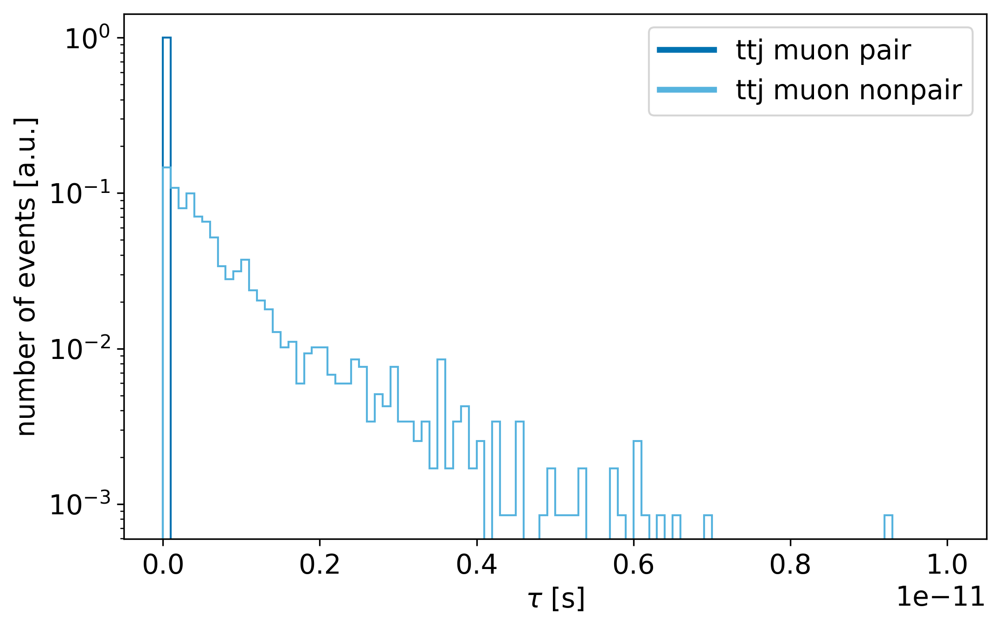

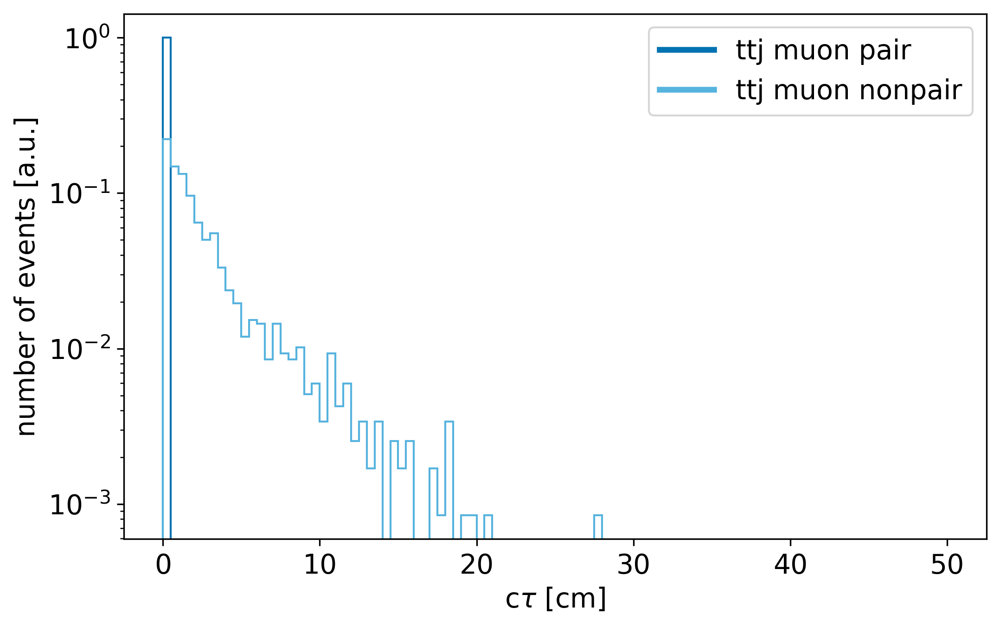

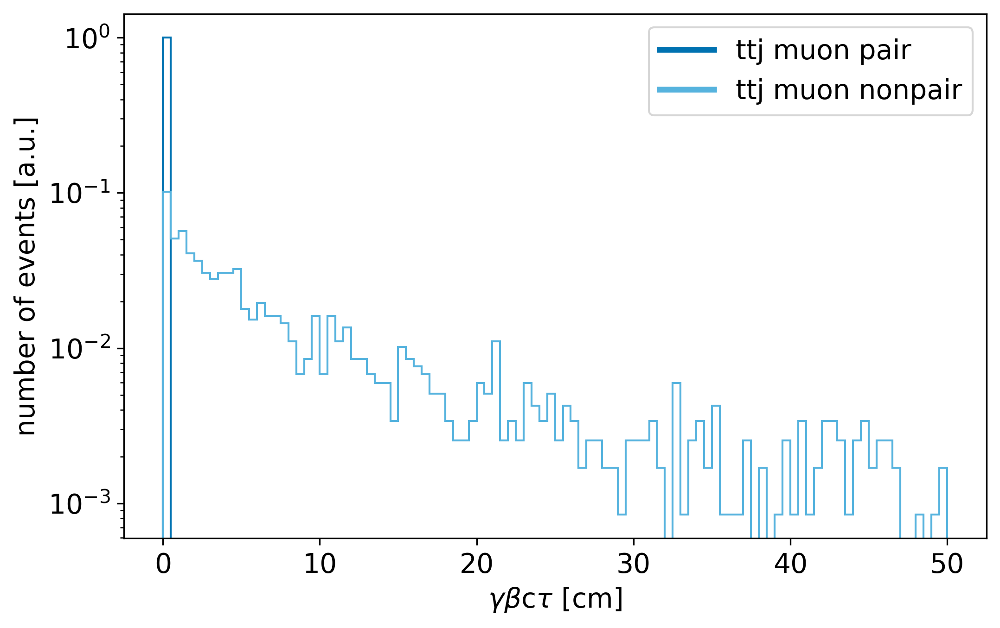

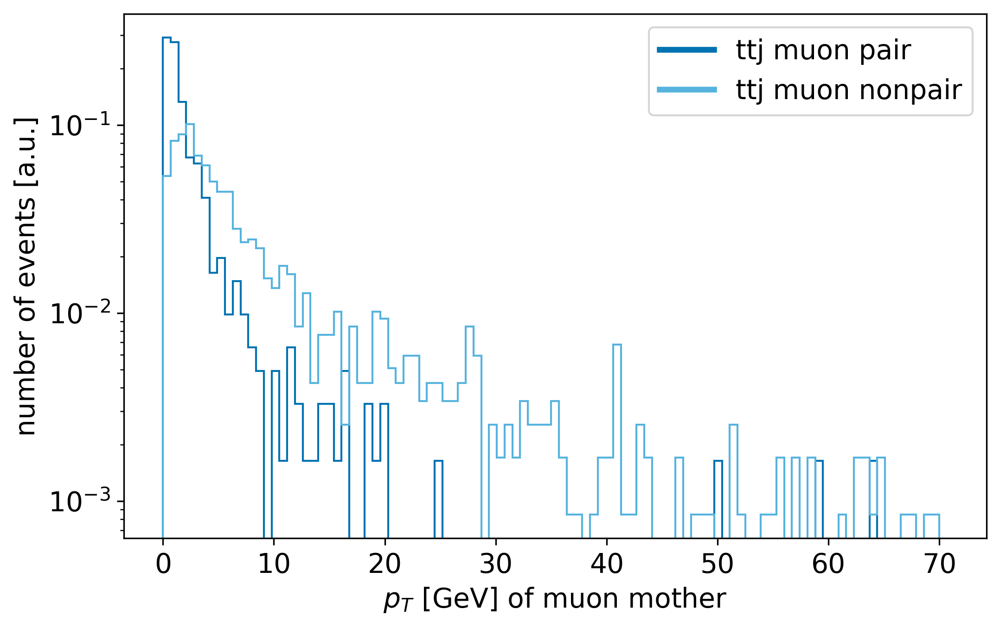

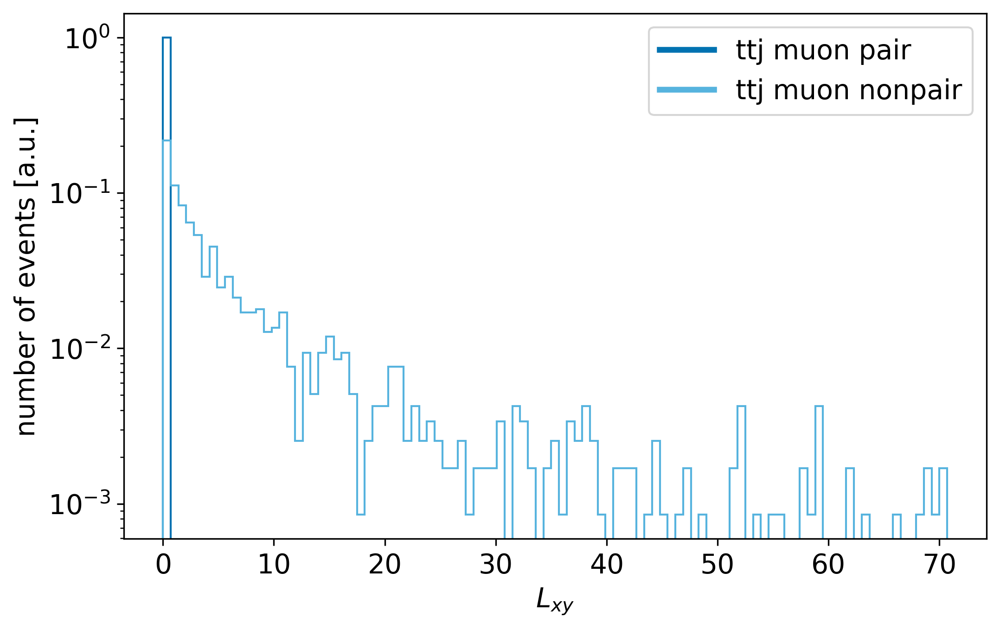

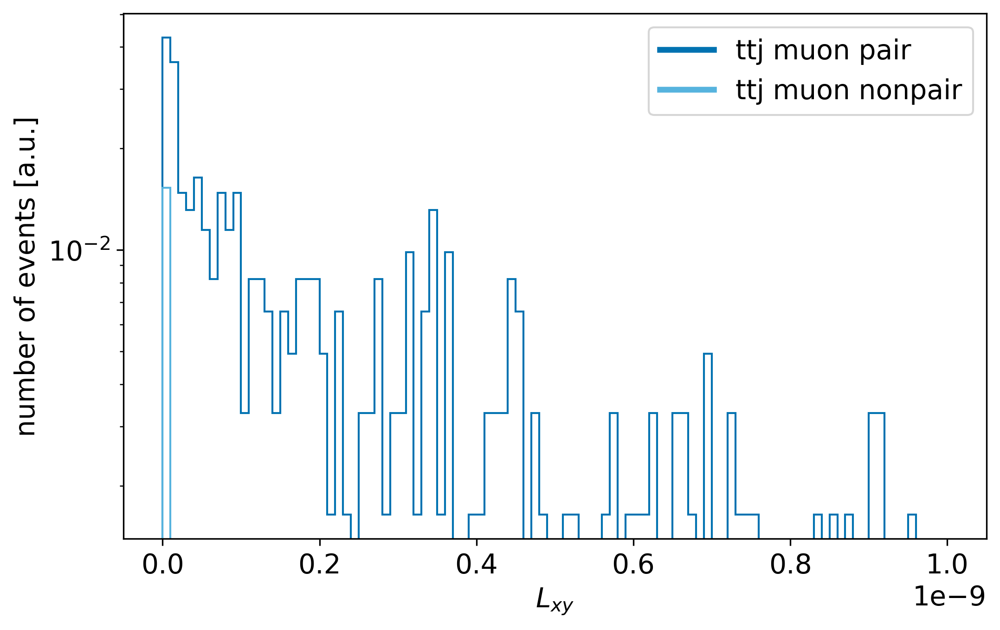

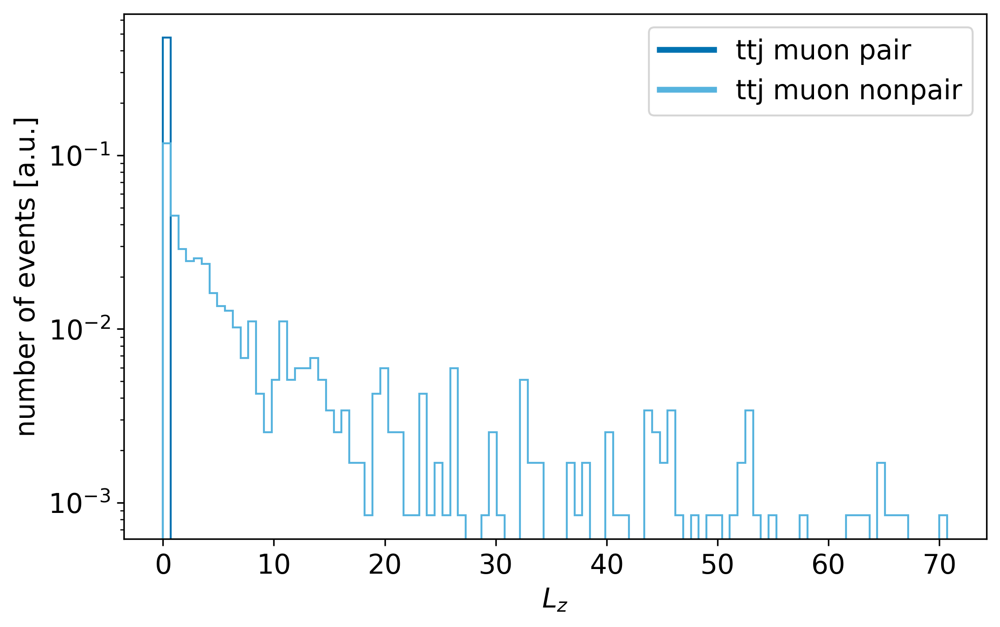

In [89]:
data_ttj_pair = data_ttj_pair_e
data_ttj_nonpair = data_ttj_nonpair_e

labelList =["ttj muon pair", "ttj muon nonpair"]

xmax = 1e-11
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("tau",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("tau",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1 
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$\tau$ [s]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("ctau",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("ctau",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1        
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"c$\tau$ [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("ctauboost",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("ctauboost",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1     
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$\gamma\beta$c$\tau$ [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 70
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("pT",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("pT",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$p_T$ [GeV] of muon mother")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 70
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("Lxy",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("Lxy",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$L_{xy}$")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-9
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("Lxy",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("Lxy",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$L_{xy}$")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 70
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("Lz",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("Lz",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$L_{z}$")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

data_ttj_pair = data_ttj_pair_org
data_ttj_nonpair = data_ttj_nonpair_org

Dimuon pT cut:
[This Dataset contains 610 events.]
[This Dataset contains 1178 events.]
[This Dataset contains 607 events.]
[This Dataset contains 1121 events.]
#Events with dimuon pT>=25:  0.4918032786885296 % of muon pairs,  4.8387096774193505 % of muon non-pairs
Trialing muon pT cut:
[This Dataset contains 610 events.]
[This Dataset contains 1178 events.]
[This Dataset contains 607 events.]
[This Dataset contains 1132 events.]


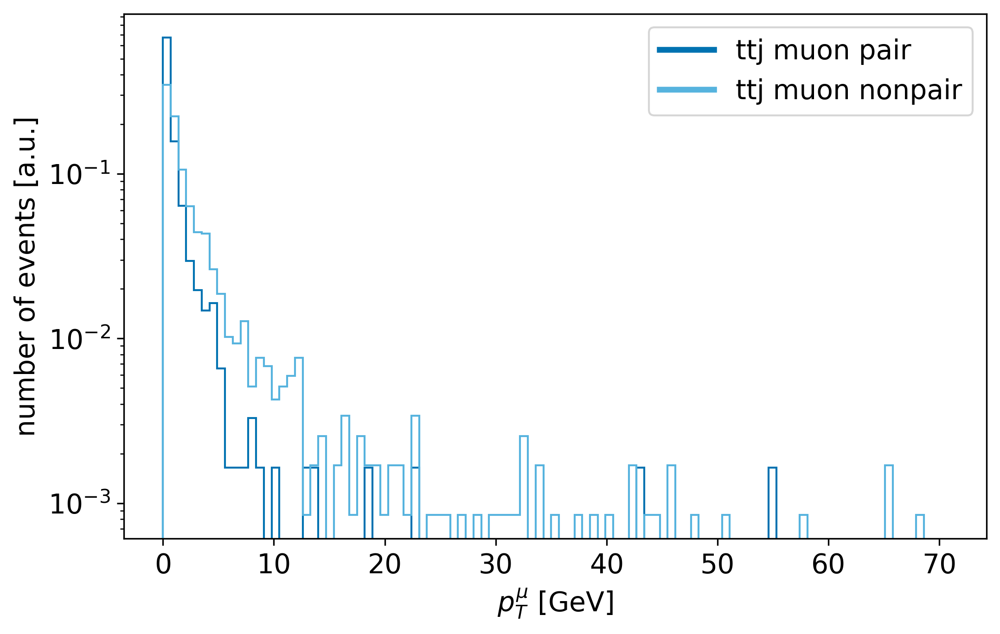

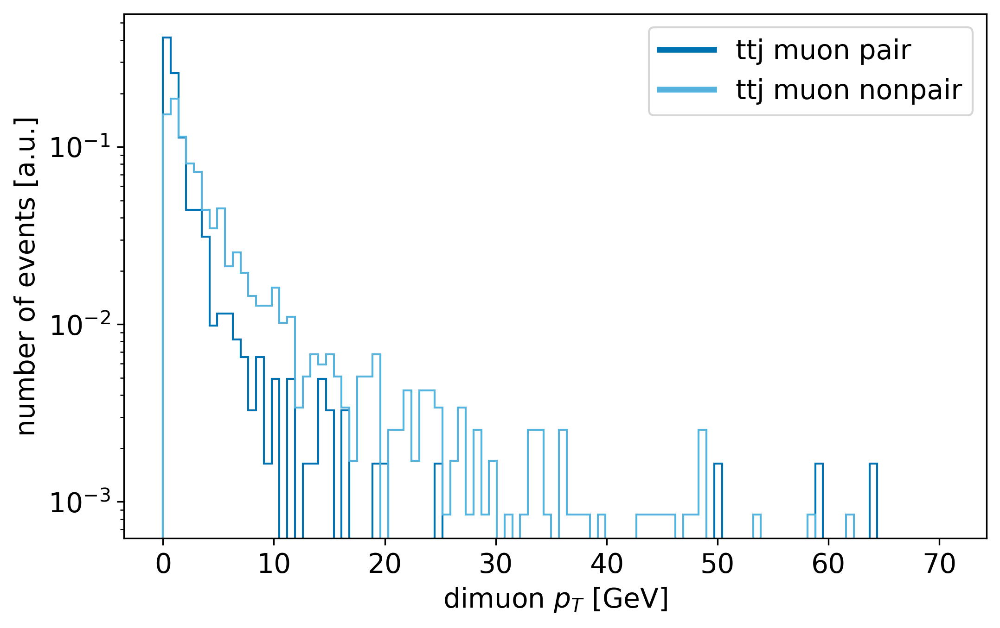

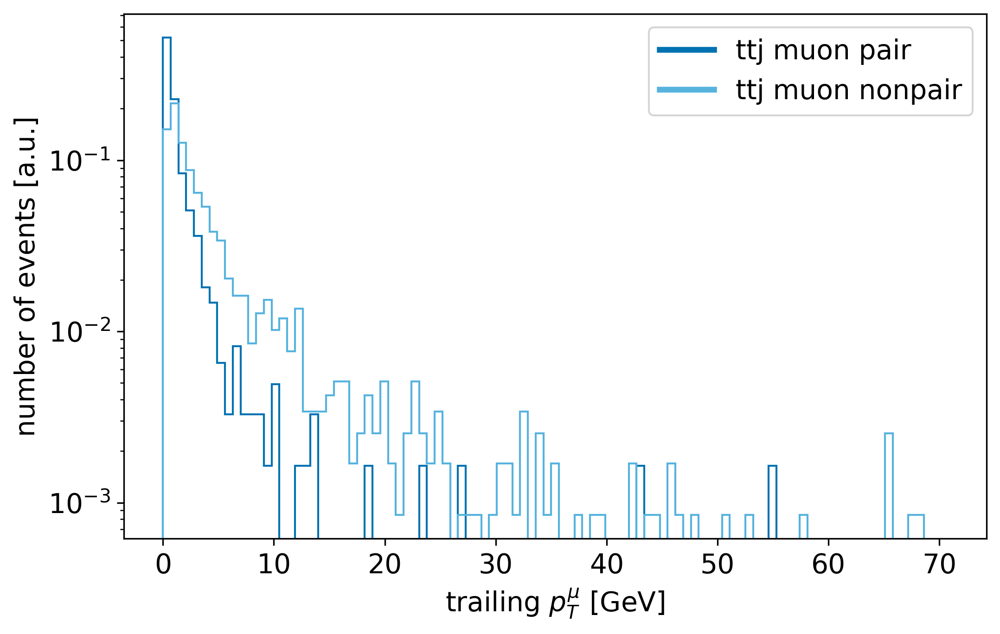

In [53]:
data_ttj_pair = data_ttj_pair_e
data_ttj_nonpair = data_ttj_nonpair_e

labelList =["ttj muon pair", "ttj muon nonpair"]

xmax = 70
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("pT",["muon"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("pT",["muon"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"$p_T^\mu$ [GeV]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 70
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("inv_pT",["muon","antimuon"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
sm_track = data("inv_pT",["muon","antimuon"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        sm_weights = len(sm_track[i])*[1/len(sm_track[i])]
        plt.hist(sm_track[i],bins=binList,color=colors[ci],histtype='step', weights=sm_weights)
        ci += 1
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"dimuon $p_T$ [GeV]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

print("Dimuon pT cut:")
print(data_ttj_pair_e)
print(data_ttj_nonpair_e)
sel = ((lambda x: x<25),"inv_pT", ["muon","antimuon"])
data_ttj_pair_dpt = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_dpt = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
print(data_ttj_pair_dpt)
print(data_ttj_nonpair_dpt)
print("#Events with dimuon pT>=25: ", (1-len(data_ttj_pair_dpt[0])/len(data_ttj_pair_e[0]))*100, 
      "% of muon pairs, ", (1-len(data_ttj_nonpair_dpt[0])/len(data_ttj_nonpair_e[0]))*100, "% of muon non-pairs")

xmax = 70
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("trailing_pT",["muon","antimuon"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
sm_track = data("trailing_pT",["muon","antimuon"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        sm_weights = len(sm_track[i])*[1/len(sm_track[i])]
        plt.hist(sm_track[i],bins=binList,color=colors[ci],histtype='step', weights=sm_weights)
        ci += 1     
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel(r"trailing $p_T^\mu$ [GeV]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

print("Trialing muon pT cut:")
print(data_ttj_pair_e)
print(data_ttj_nonpair_e)
sel = ((lambda x: x<25),"trailing_pT", ["muon","antimuon"])
data_ttj_pair_tpt = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_tpt = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
print(data_ttj_pair_tpt)
print(data_ttj_nonpair_tpt)

data_ttj_pair = data_ttj_pair_org
data_ttj_nonpair = data_ttj_nonpair_org

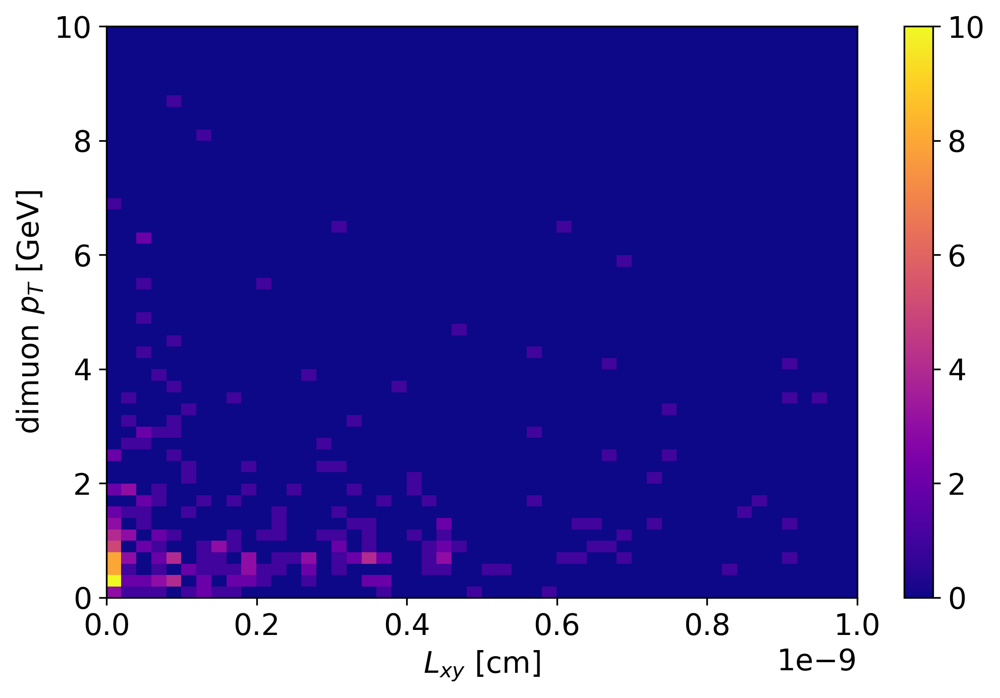

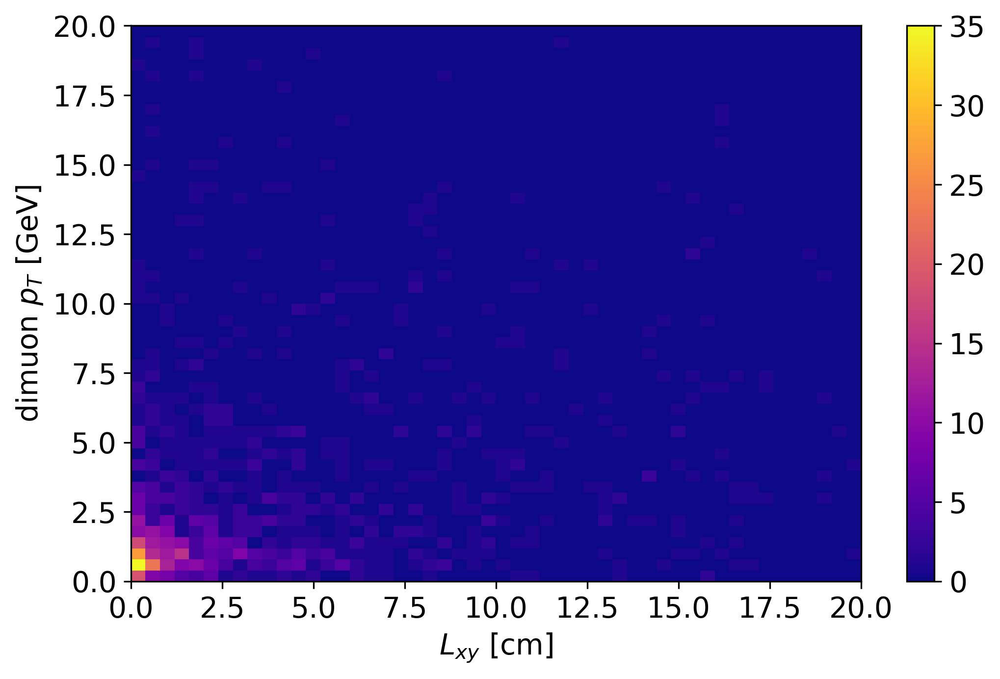

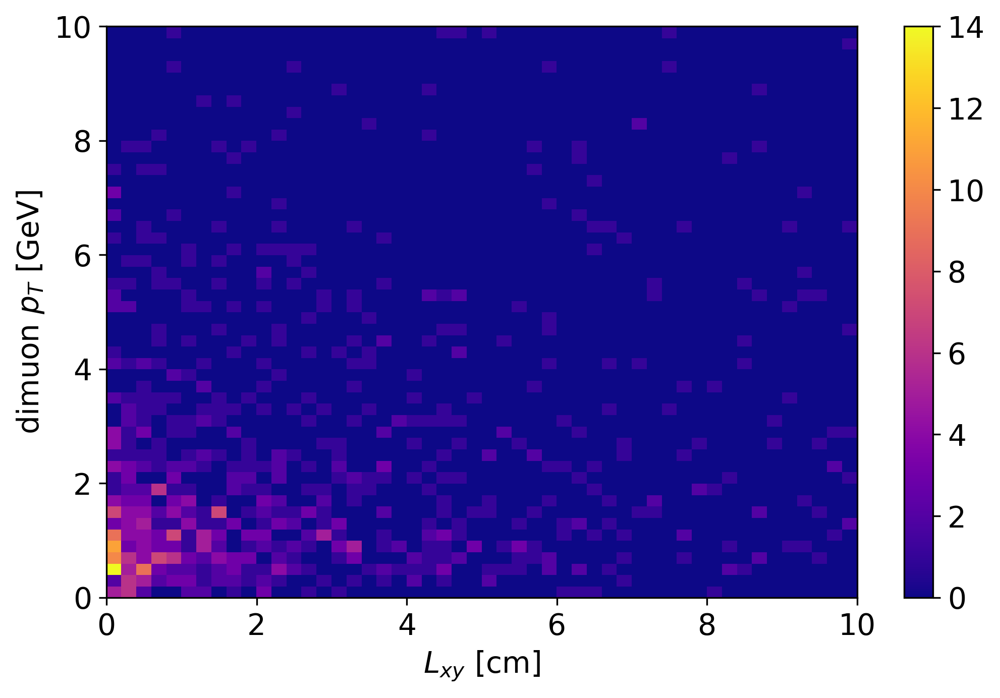

In [106]:
data_ttj_pair = data_ttj_pair_e
data_ttj_nonpair = data_ttj_nonpair_e

plt.figure()
ci = 0
mp_track = data("inv_pT",["muon","antimuon"],"ttj_pair")
mp_lxy = data("Lxy",["muonmother"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        #mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist2d(mp_lxy[i],mp_track[i],range=[[0,1e-9],[0,10]], bins=(50,50), cmap="plasma")
plt.xlabel(r"$L_{xy}$ [cm]")
plt.ylabel(r"dimuon $p_T$ [GeV]")    
plt.colorbar()

plt.figure()
sm_track = data("inv_pT",["muon","antimuon"],"ttj_nonpair")
sm_lxy = data("Lxy",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        plt.hist2d(sm_lxy[i],sm_track[i],range=[[0,20],[0,20]],bins=(50,50), cmap="plasma")
plt.xlabel(r"$L_{xy}$ [cm]")
plt.ylabel(r"dimuon $p_T$ [GeV]")
plt.colorbar()

plt.figure()
sm_track = data("inv_pT",["muon","antimuon"],"ttj_nonpair")
sm_lxy = data("Lxy",["muonmother"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        plt.hist2d(sm_lxy[i],sm_track[i],range=[[0,10],[0,10]],bins=(50,50), cmap="plasma")
plt.xlabel(r"$L_{xy}$ [cm]")
plt.ylabel(r"dimuon $p_T$ [GeV]")
plt.colorbar()

In [13]:
# Make a cut for pT>10
sel = ((lambda x: x>10),"pT", ["muon"])
data_ttj_pair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
sel = ((lambda x: x>10),"pT", ["antimuon"])
data_ttj_pair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_pT]
data_ttj_nonpair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_pT]
print(data_ttj_pair_pT)
print(data_ttj_nonpair_pT)

# Make a cut deltaR>0.2
sel = ((lambda x: x>0.2),"deltaR", ["muon","antimuon"])
data_ttj_pair_dR = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_pT]
data_ttj_nonpair_dR = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_pT]

print(data_ttj_pair_dR)
print(data_ttj_nonpair_dR)


[This Dataset contains 2 events.]
[This Dataset contains 13 events.]
[This Dataset contains 2 events.]
[This Dataset contains 13 events.]


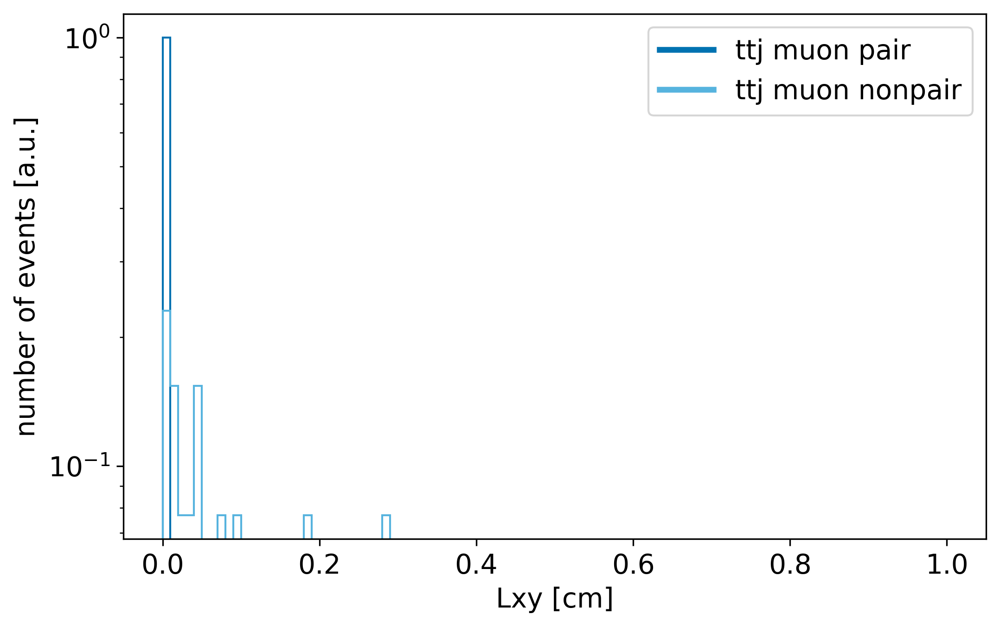

In [16]:
data_ttj_pair = data_ttj_pair_dR
data_ttj_nonpair = data_ttj_nonpair_dR

# Muon tracks:

#labelList = ['l = 0.0 - 0.2', 'l = 0.2 - 1.0','l = 1.0 - 2.4','l = 2.4 - 3.1','l = 3.1 - 7.0','l = 7.0 - 11.0']
#labelList = ['l = 0.0 - 11.0']
labelList =["ttj muon pair", "ttj muon nonpair"]
#dat_sm = data("c_tau",["muon"],"ttj_nonpair")
min_displacements = [0.0, 0.2, 1.0, 2.4, 3.1, 7.0]
max_displacements = [0.2, 1.0, 2.4, 3.1, 7.0, 11.0]

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("Lxy",["muonmother","muon"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("Lxy",["muonmother","muon"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
        
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel("Lxy [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

data_ttj_pair = data_ttj_pair_org
data_ttj_nonpair = data_ttj_nonpair_org

In [130]:
# Make a Lxy cut
sel = ((lambda x: x<0.2),"Lxy", ["muonmother","muon"])
data_ttj_pair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
sel = ((lambda x: x<0.2),"Lxy", ["antimuonmother","antimuon"])
data_ttj_pair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l0p2]
data_ttj_nonpair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l0p2]

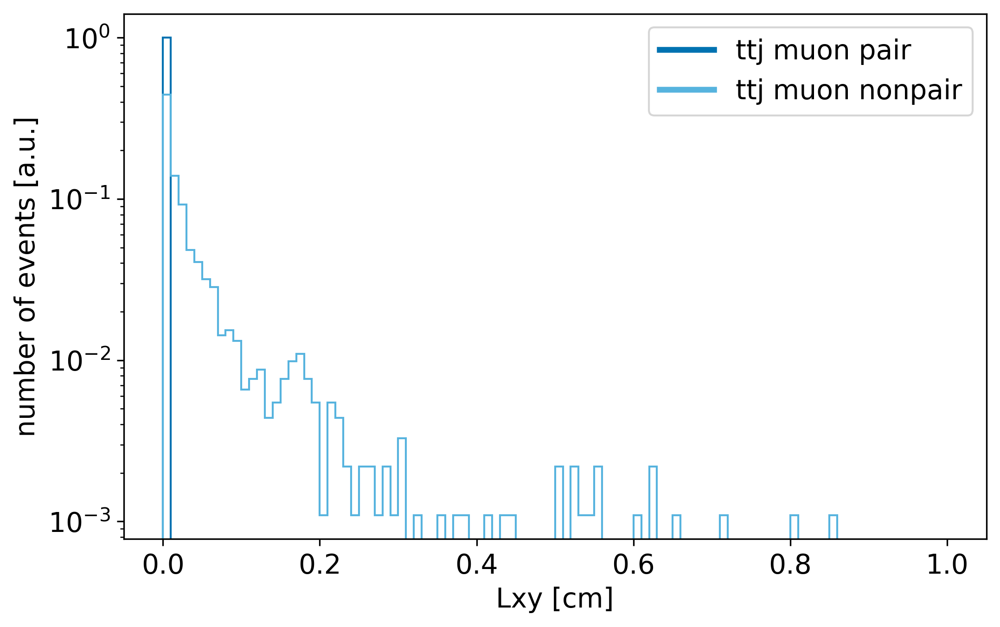

In [132]:
data_ttj_pair = data_ttj_pair_l0p2
data_ttj_nonpair = data_ttj_nonpair_l0p2

# Muon tracks:

#labelList = ['l = 0.0 - 0.2', 'l = 0.2 - 1.0','l = 1.0 - 2.4','l = 2.4 - 3.1','l = 3.1 - 7.0','l = 7.0 - 11.0']
#labelList = ['l = 0.0 - 11.0']
labelList =["ttj muon pair", "ttj muon nonpair"]
#dat_sm = data("c_tau",["muon"],"ttj_nonpair")
min_displacements = [0.0, 0.2, 1.0, 2.4, 3.1, 7.0]
max_displacements = [0.2, 1.0, 2.4, 3.1, 7.0, 11.0]

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
ci = 0
mp_track = data("Lxy",["muonmother","muon"],"ttj_pair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
mp_track = data("Lxy",["muonmother","muon"],"ttj_nonpair")
for i in range(len(mp_track)):
    if len(mp_track[i]!=0):
        mp_weights = len(mp_track[i])*[1/len(mp_track[i])]
        plt.hist(mp_track[i],bins=binList,color=colors[ci],histtype='step', weights=mp_weights)
        ci += 1
        
handles = [Line2D([],[],c=colors[cc],lw=3) for cc in range(ci)]
plt.legend(handles,labelList)
plt.xlabel("Lxy [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')


In [24]:
# Make a ctau cut
sel = ((lambda x: x<0.2),"c_tau", ["muon"])
data_ttj_pair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
sel = ((lambda x: x<0.2),"c_tau", ["antimuon"])
data_ttj_pair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l0p2]
data_ttj_nonpair_l0p2 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l0p2]

sel = ((lambda x: x>0.2 and x<1.0),"c_tau", ["muon"])
data_ttj_pair_l1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_l1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
sel = ((lambda x: x>0.2 and x<1.0),"c_tau", ["antimuon"])
data_ttj_pair_l1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l1]
data_ttj_nonpair_l1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l1]

sel = ((lambda x: x>1.0 and x<2.4),"c_tau", ["muon"])
data_ttj_pair_l2p4 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_l2p4 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
sel = ((lambda x: x>1.0 and x<2.4),"c_tau", ["antimuon"])
data_ttj_pair_l2p4 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l2p4]
data_ttj_nonpair_l2p4 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l2p4]

sel = ((lambda x: x>2.4 and x<3.1),"c_tau", ["muon"])
data_ttj_pair_l3p1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_l3p1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
sel = ((lambda x: x>2.4 and x<3.1),"c_tau", ["antimuon"])
data_ttj_pair_l3p1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l3p1]
data_ttj_nonpair_l3p1 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l3p1]

sel = ((lambda x: x>3.1 and x<7.0),"c_tau", ["muon"])
data_ttj_pair_l7 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_l7 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
sel = ((lambda x: x>3.1 and x<7.0),"c_tau", ["antimuon"])
data_ttj_pair_l7 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l7]
data_ttj_nonpair_l7 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l7]

sel = ((lambda x: x>7.0 and x<11.0),"c_tau", ["muon"])
data_ttj_pair_l11 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_l11 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
sel = ((lambda x: x>7.0 and x<11.0),"c_tau", ["antimuon"])
data_ttj_pair_l11 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_l11]
data_ttj_nonpair_l11 = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_l11]

data_ttj_pair_lcuts = [data_ttj_pair_l0p2[0],data_ttj_pair_l1[0],data_ttj_pair_l2p4[0],data_ttj_pair_l3p1[0],
                       data_ttj_pair_l7[0],data_ttj_pair_l11[0]]
data_ttj_nonpair_lcuts = [data_ttj_nonpair_l0p2[0],data_ttj_nonpair_l1[0],data_ttj_nonpair_l2p4[0],
                          data_ttj_nonpair_l3p1[0],data_ttj_nonpair_l7[0],data_ttj_nonpair_l11[0]]


[This Dataset contains 1397 events.]
[This Dataset contains 1397 events.]


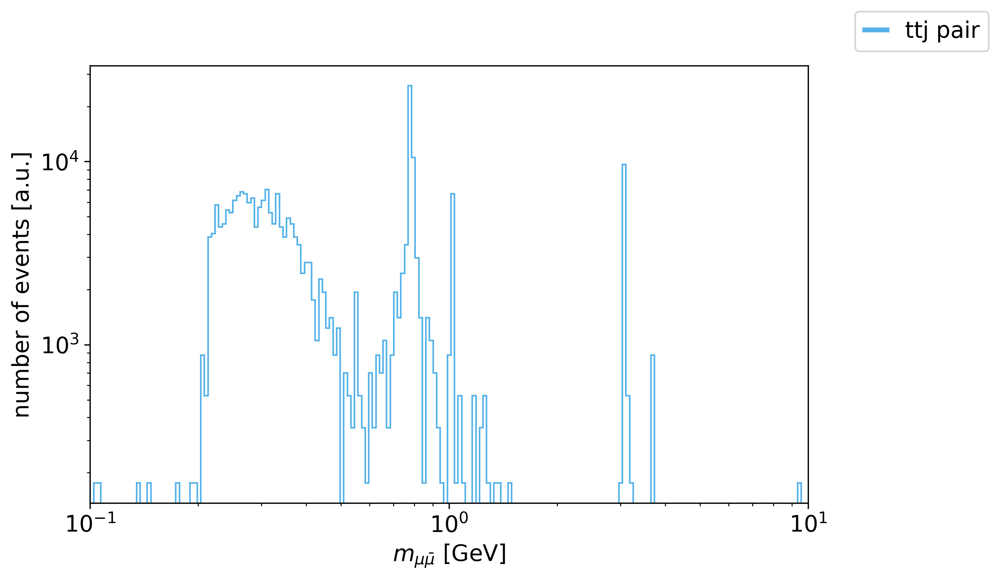

In [50]:
data_ttj_pair = data_ttj_pair_l0p2
print(data_ttj_pair_l0p2)
print(data_ttj_pair_org)
massLabels = ['ttj pair']
labels2 = ['ttj_nonpair']
mypl.histloglog(data("inv_mass",["antimuon","muon"],"ttj_pair"),[],[cross_ttj],
                [],[N_ttj],[],intlumi,massLabels,dirLabel["mmumu"],customXlabels=labels2,nbins=201,
                customXlim=[0.1,10],selLabel=[])

In [124]:
mp_mothers = data_ttj_pair[0].count_muon_mothers()
print(mp_mothers)
print(sum(mp_mothers.values()))
sm_mothers = data_ttj_nonpair[0].count_muon_mothers()
print(sm_mothers)
print(sum(sm_mothers.values()))
for key in mp_mothers:
    if key is not 13 and key is not 22:
        print(key, "\t", mp_mothers[key], "\t", decay_lengths[key])
for key in sm_mothers:
    if key is not 13 and key is not 22:
        print(key, "\t", sm_mothers[key], "\t", decay_lengths[key])

{113: 216, 221: 1262, 223: 1046, 331: 48, 333: 90, 443: 120, 553: 2, 100443: 10}
2794
{13: 6, 15: 99, 22: 58, 411: 1890, 421: 1546, 431: 340, 511: 350, 521: 347, 531: 69, 3112: 7, 3122: 7, 3322: 1, 4122: 77, 4132: 3, 4232: 8, 4332: 2, 5122: 16, 5132: 4, 5232: 4}
4834
113 	 216 	 1.3387176420898309e-13
221 	 1262 	 1.5063128278171074e-08
223 	 1046 	 2.273352309263146e-12
331 	 48 	 1.0496115981066014e-10
333 	 90 	 4.642987775153908e-12
443 	 120 	 2.13096091192269e-10
553 	 2 	 3.652850433988172e-10
100443 	 10 	 6.711802055919763e-11
15 	 99 	 0.00870297505574
411 	 1890 	 0.0309685609114
421 	 1546 	 0.012300484551739998
431 	 340 	 0.0151095398832
511 	 350 	 0.045538474370200005
521 	 347 	 0.049106004620400004
531 	 69 	 0.045568453616
3112 	 7 	 4.43393045382
3122 	 7 	 7.890537494559998
3322 	 1 	 8.693981282
4122 	 77 	 0.0060408180287
4132 	 3 	 0.00455384743702
4232 	 8 	 0.013580598347399999
4332 	 2 	 0.0080344378744
5122 	 16 	 0.044099470571800005
5132 	 4 	 0.0471273743

In [125]:
mp_decay_lenghts_arr = np.ndarray(shape=(0,0),dtype=int)
sm_decay_lenghts_arr = np.ndarray(shape=(0,0),dtype=int)
for key in decay_lengths:
    scale = decay_lengths[key]
    if key in mp_mothers:
        mp_size = int(mp_mothers[key])
        mp_decay_lenghts_arr = np.append(mp_decay_lenghts_arr, np.random.exponential(scale=scale,size=mp_size))
    if key in sm_mothers:
        sm_size = int(sm_mothers[key])
        sm_decay_lenghts_arr = np.append(sm_decay_lenghts_arr, np.random.exponential(scale=scale,size=sm_size))
        
print(mp_decay_lenghts_arr)
print(len(mp_decay_lenghts_arr))
print(sm_decay_lenghts_arr)
print(len(sm_decay_lenghts_arr))

[3.17506541e-13 5.42476673e-14 3.74749999e-14 ... 8.46994553e-12
 7.41861729e-11 9.57156665e-11]
2794
[0.00118058 0.00267632 0.00090477 ... 0.05114291 0.16180359 0.00635324]
4770


In [9]:
filenames_inclusive= []
filenames_inclusive.append(inputpath+"inclusive/ma000300.lhe")
filenames_inclusive.append(inputpath+"inclusive/ma001000.lhe")
filenames_inclusive.append(inputpath+"inclusive/ma010000.lhe")
filenames_inclusive.append(inputpath+"inclusive/ma050000.lhe")
data_inclusive = [dc.Dataset.from_lhe_alp(filename)
                     for filename in filenames_inclusive]

massLabels = [r"$m_a=300\,$MeV",r"$m_a=1\,$GeV",r"$m_a=10\,$GeV",r"$m_a=50\,$GeV"]

/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma000300.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated
/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma001000.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated
/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma010000.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated
/eos/user/j/jalimena/TTALP/lhe_files/inclusive/ma050000.lhe read with [alp, top, antitop, muon, antimuon] in 100000 Events, where muons generated


In [116]:
data_inclusive2 = [dc.Dataset.from_lhe_alp(filename) for filename in filenames_inclusive]

KeyboardInterrupt: 

In [10]:
data_inclusive_org = data_inclusive

In [11]:
intlumi = 150*1000 #pb-1

cross_incl_all = [0.08800288, 0.0878576, 0.0923017, 0.09592004, 0.09589373000000001, 
                  0.09378335999999998, 0.08844931999999998, 0.08216535999999999, 0.06951777000000002, 
                  0.04509247499999999]
cross_incl = []
cross_incl.append(cross_incl_all[1]) # 300 MeV
cross_incl.append(cross_incl_all[2]) # 1 GeV
cross_incl.append(cross_incl_all[5]) # 10 GeV
cross_incl.append(cross_incl_all[8]) # 50 GeV
N_incl = 100000

cross_ttj = [233.923699] 
N_ttj = 200000


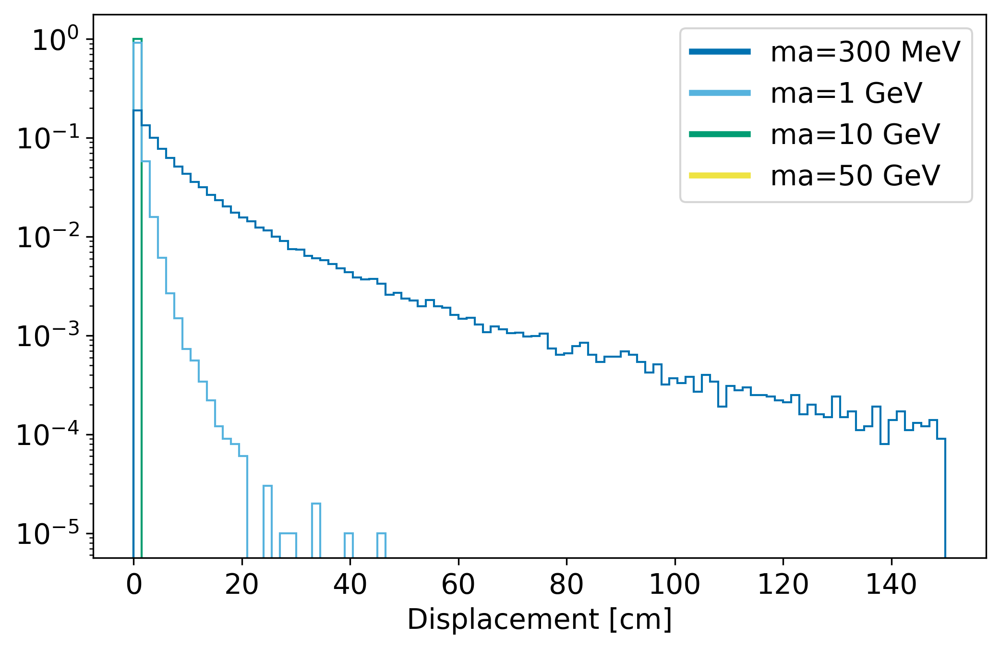

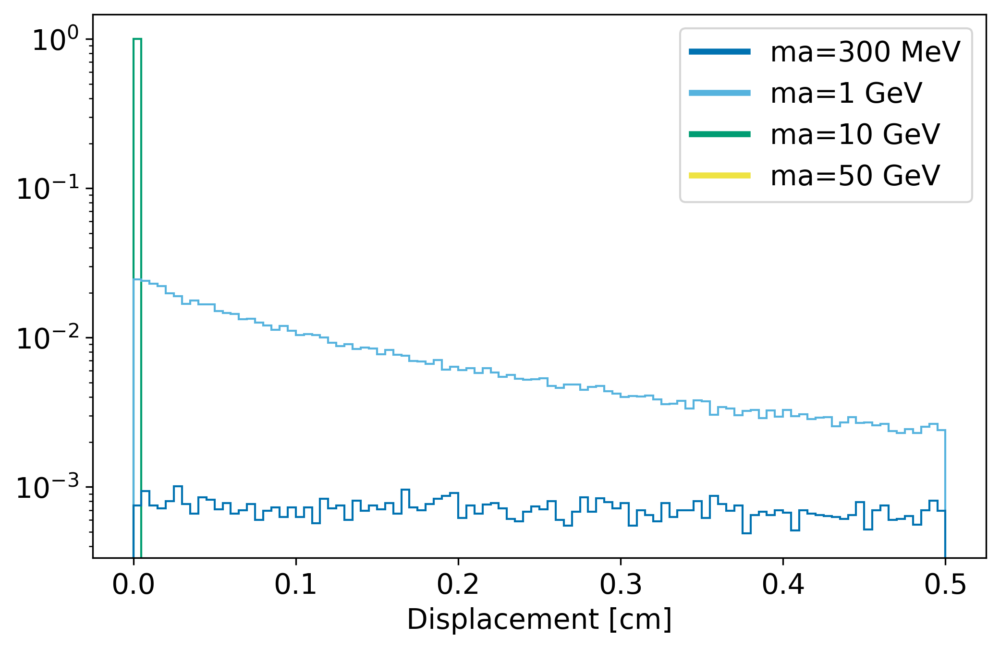

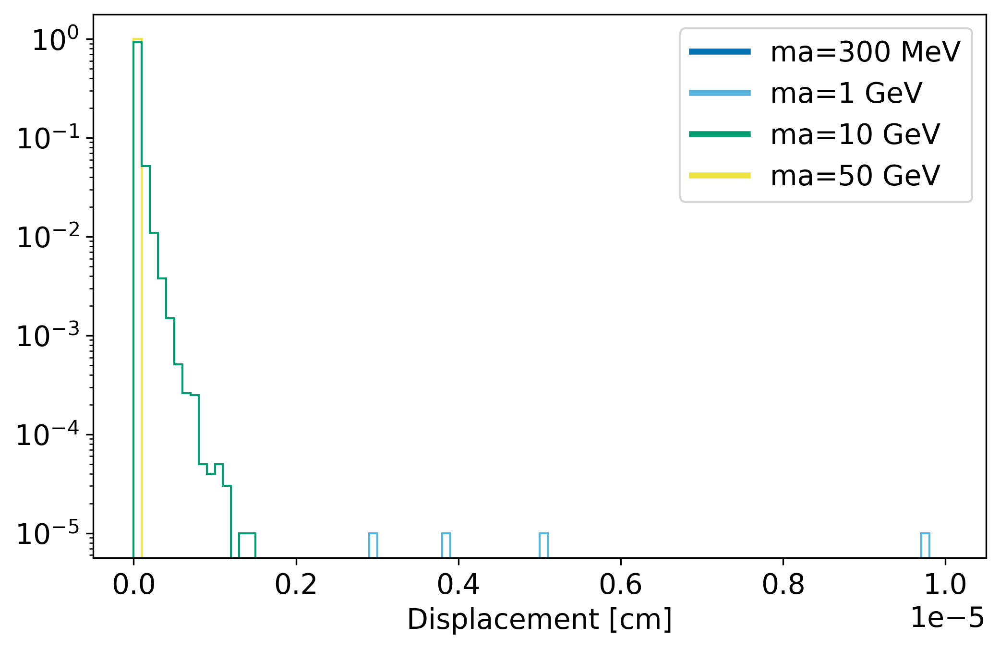

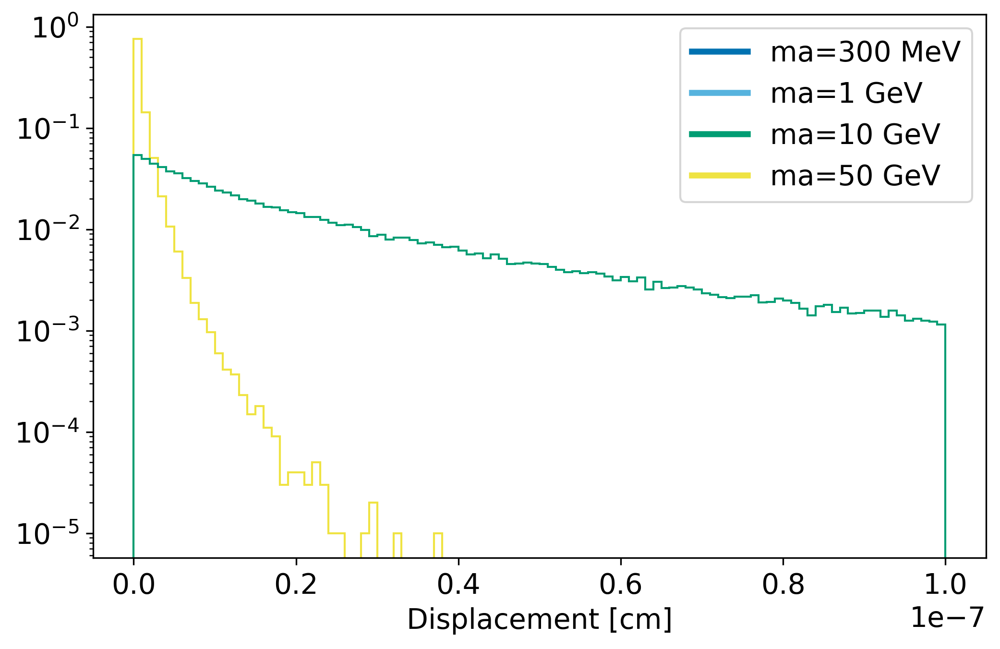

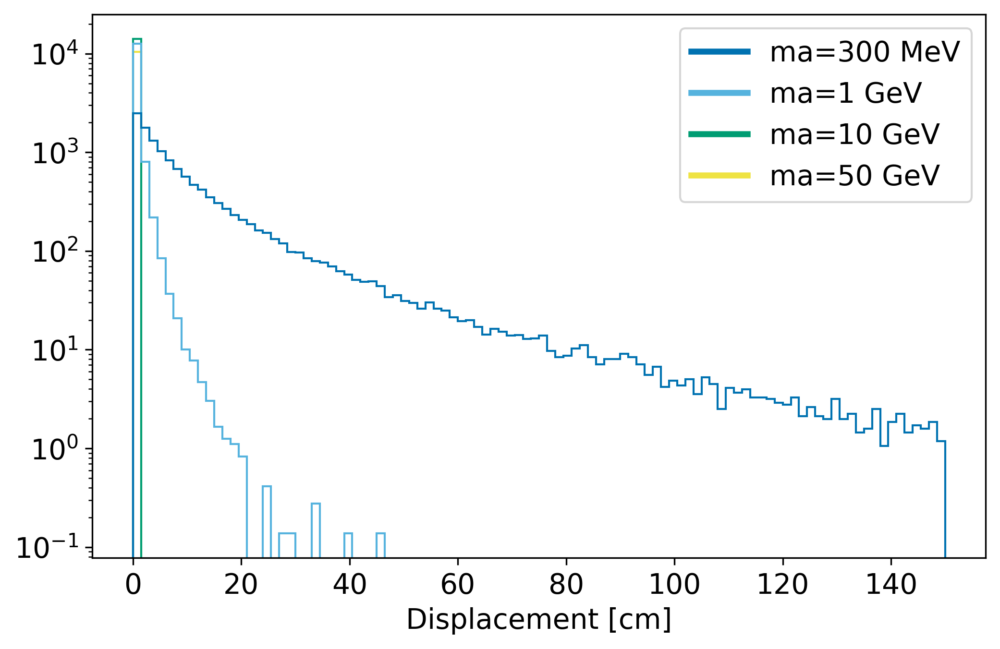

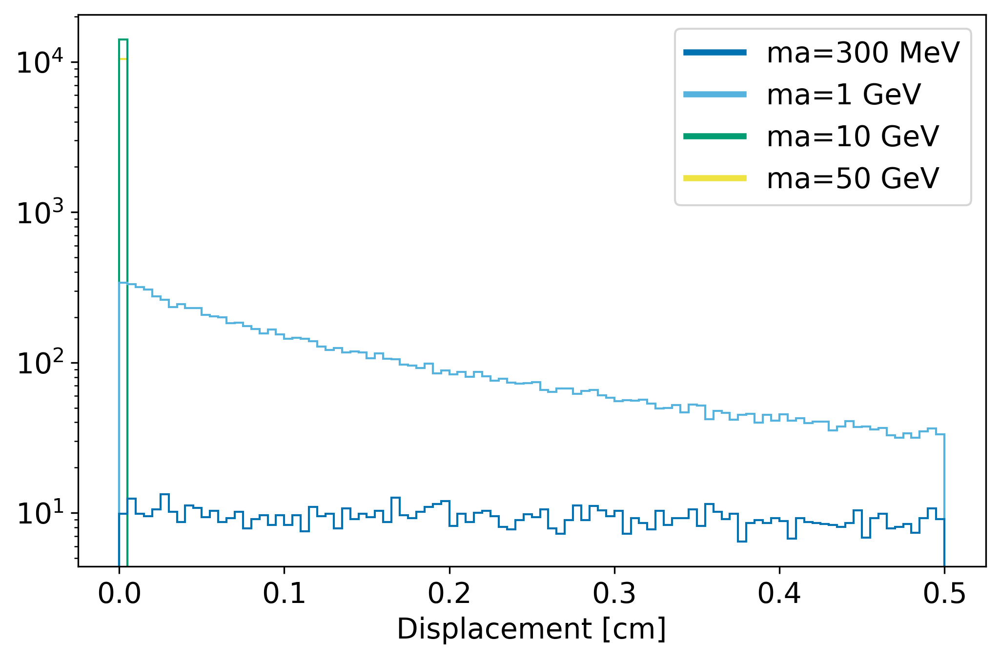

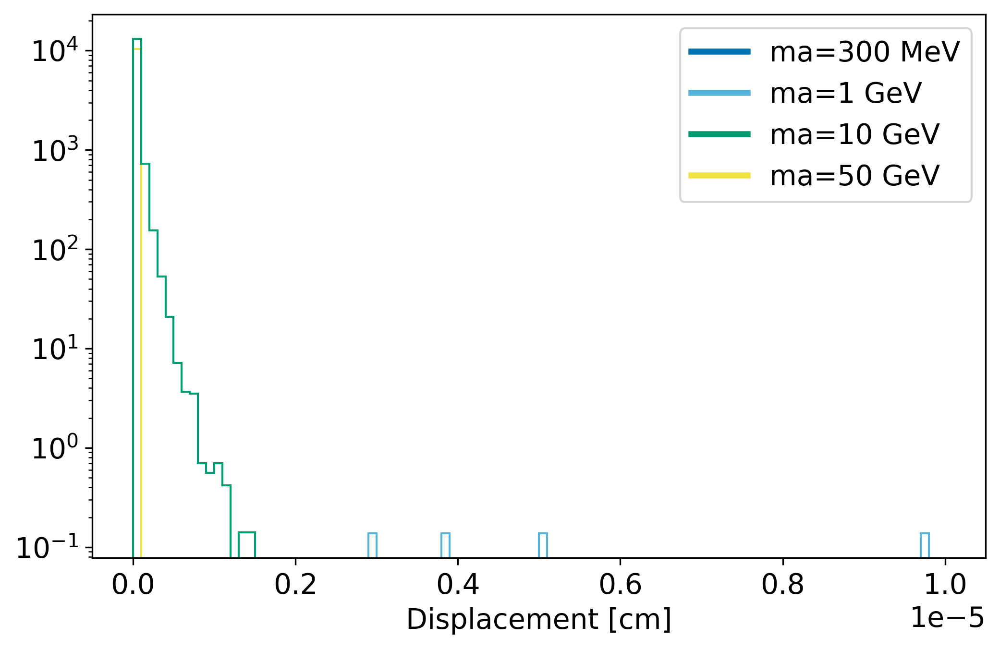

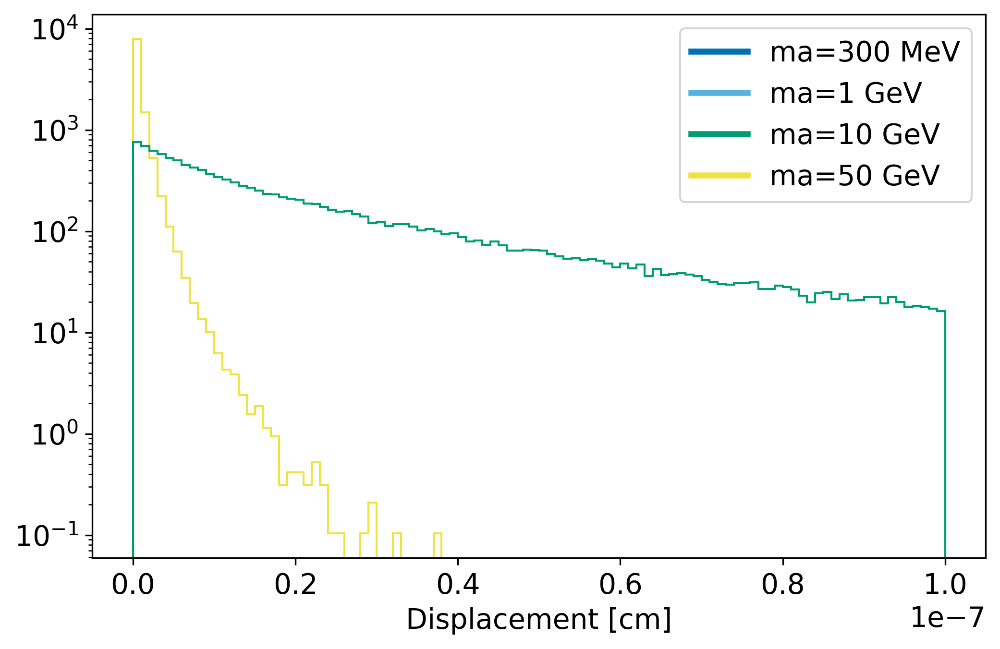

In [117]:
handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[1],lw=3),Line2D([],[],c=colors[2],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV']

data_inclusive = data_inclusive_org

dat = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat[i])*[1/len(dat[i])]) for i in range(len(dat))]

xmax = 150
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1e-7
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

inclusive_weights = [np.array(len(dat[i])*[1/N_incl])*cross_incl[i]*intlumi for i in range(len(dat))]

xmax = 150
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-7
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

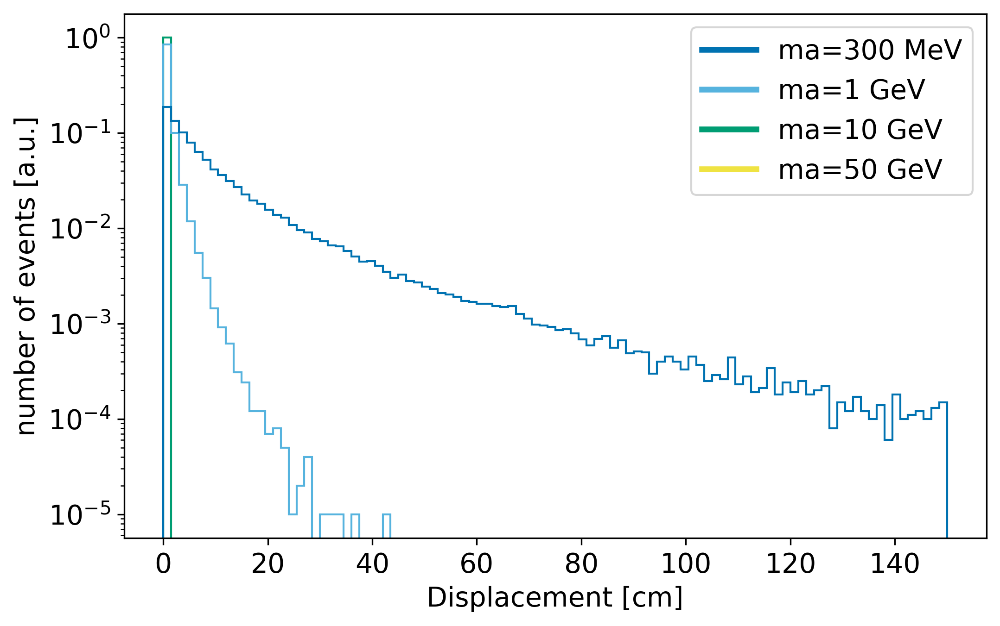

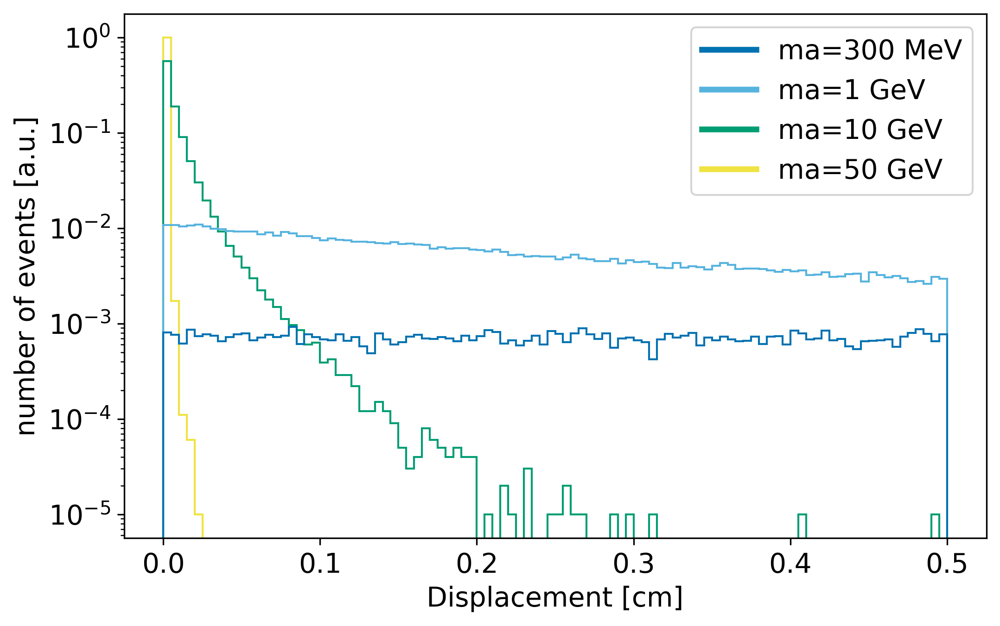

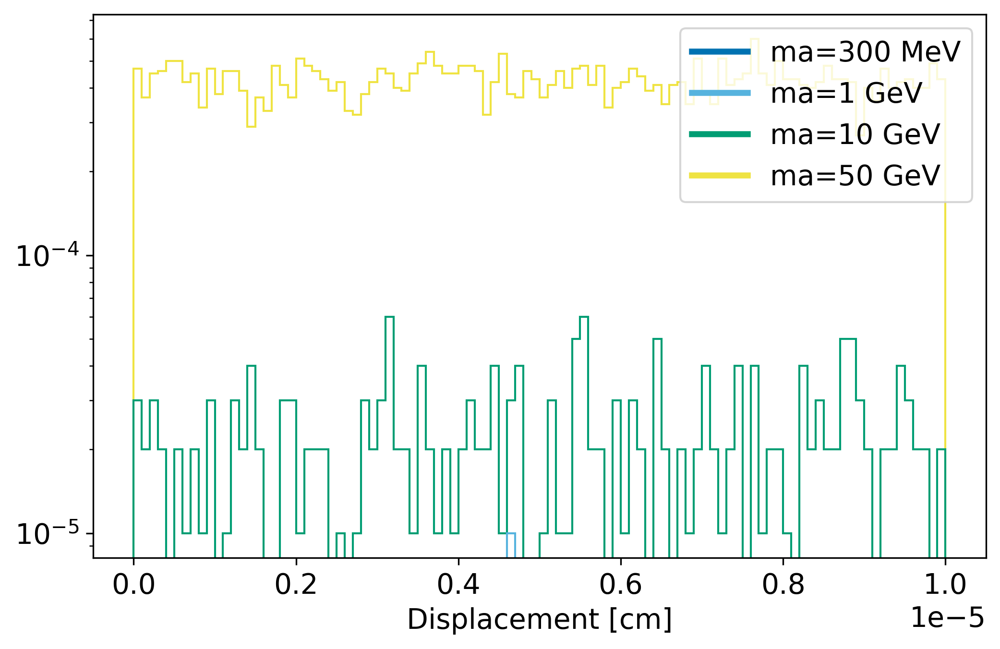

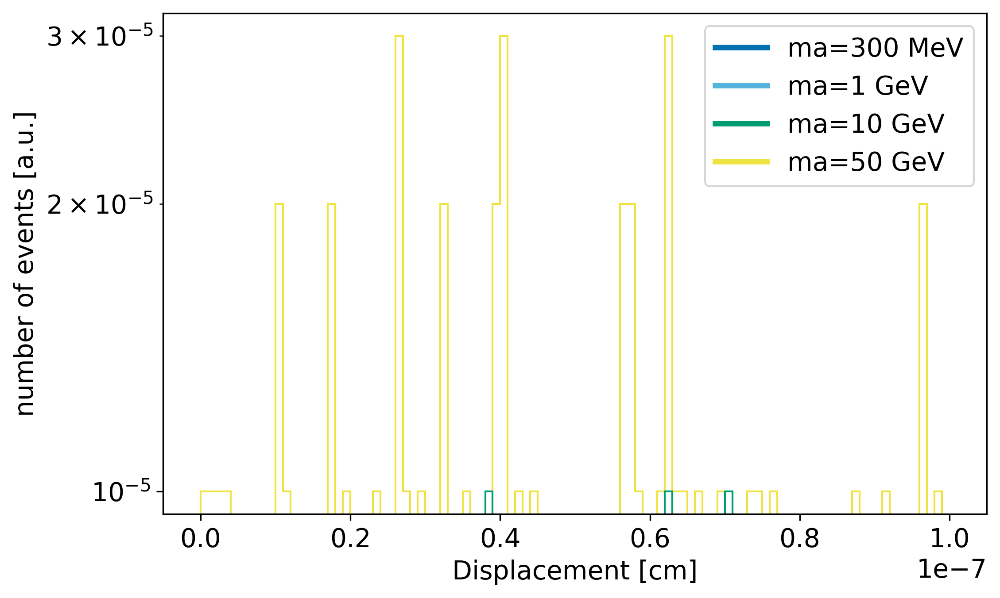

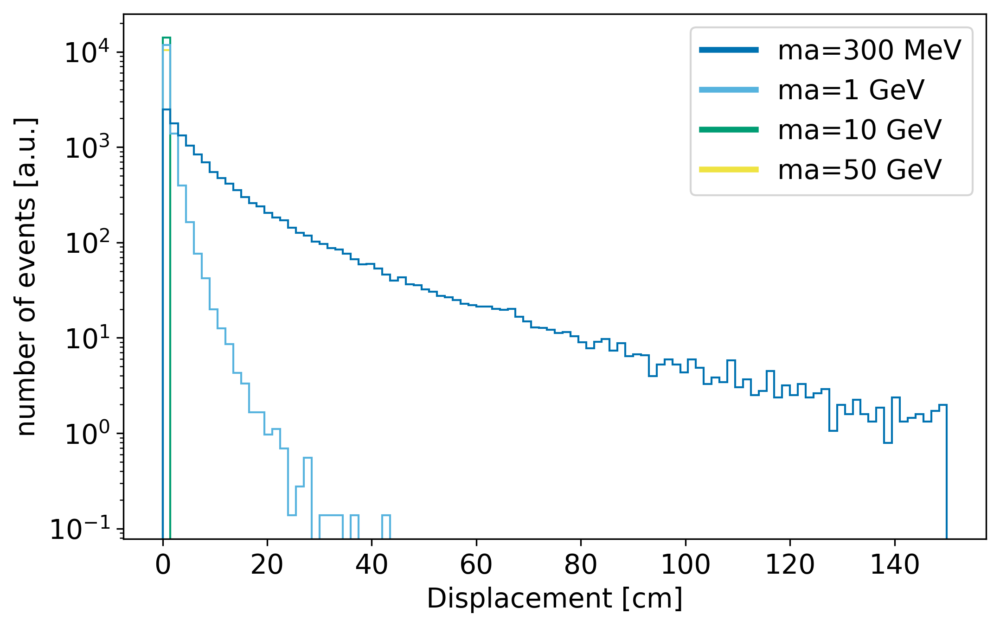

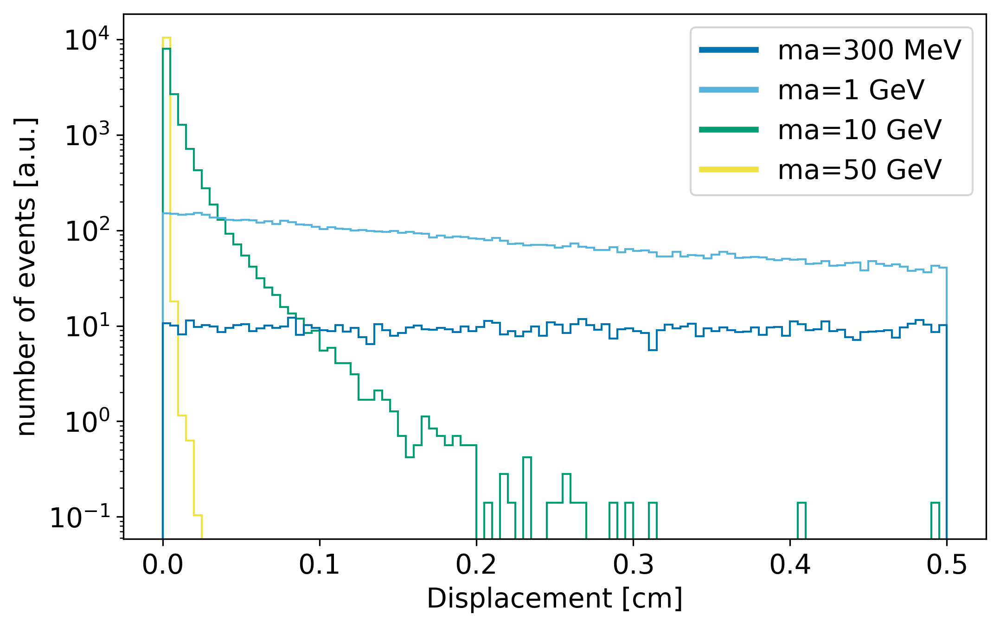

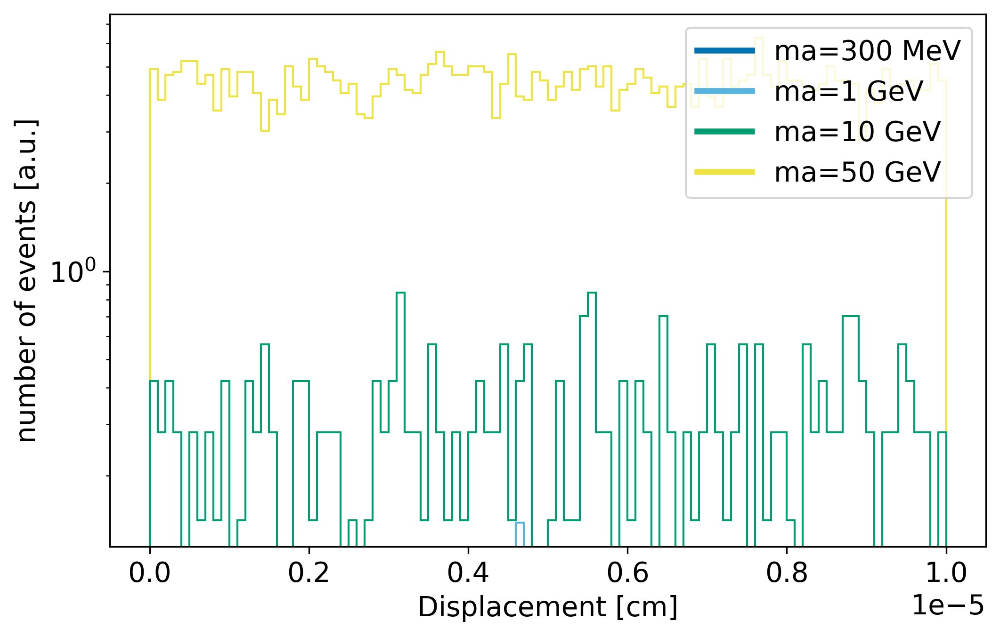

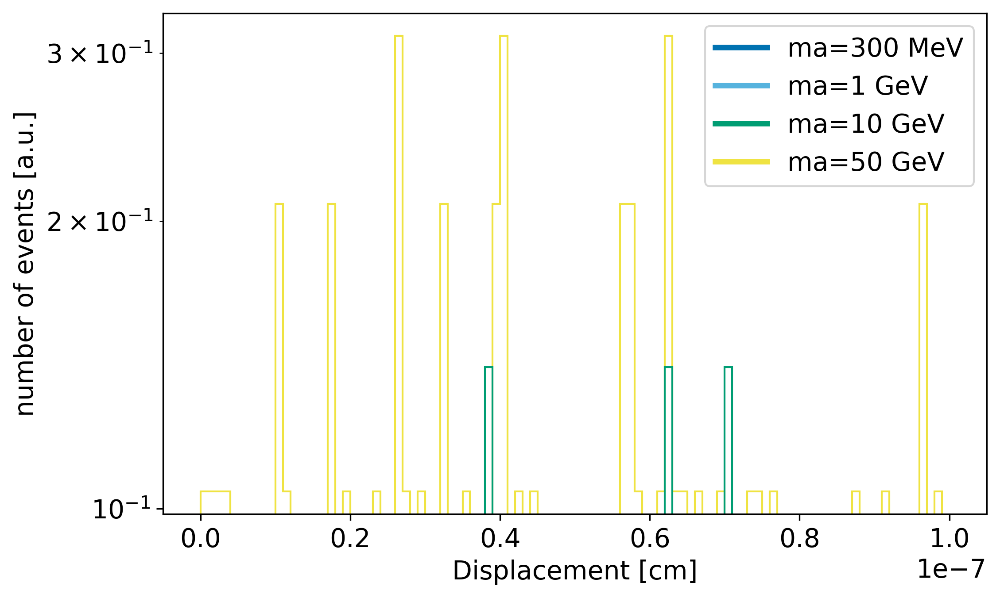

In [12]:
handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[1],lw=3),Line2D([],[],c=colors[2],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV']

data_inclusive = data_inclusive_org

dat = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat[i])*[1/len(dat[i])]) for i in range(len(dat))]

xmax = 150
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1e-7
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

inclusive_weights = [np.array(len(dat[i])*[1/N_incl])*cross_incl[i]*intlumi for i in range(len(dat))]

xmax = 150
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-5
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-7
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

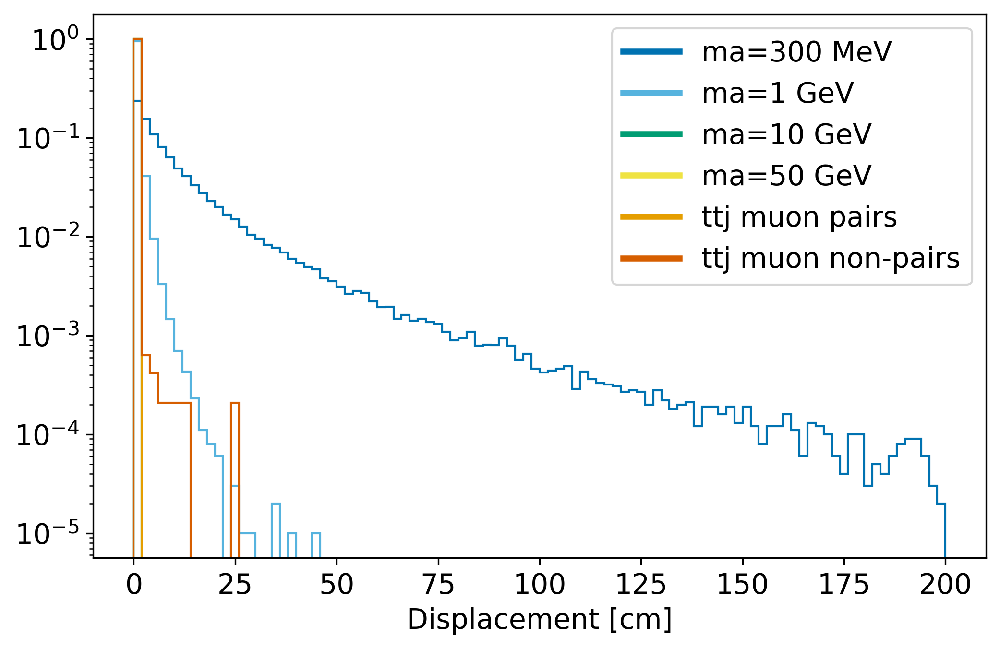

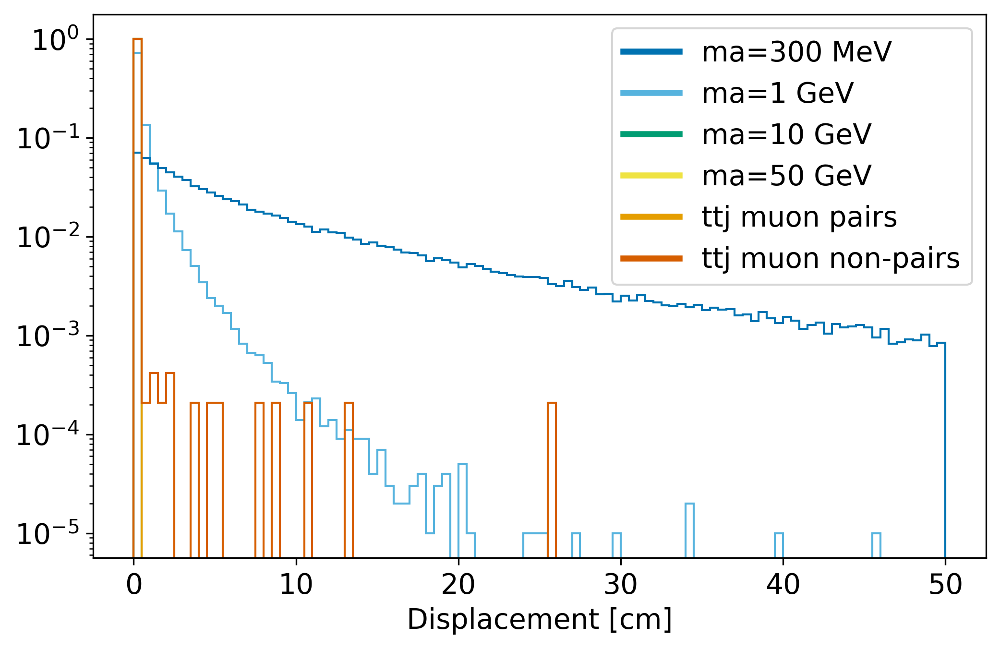

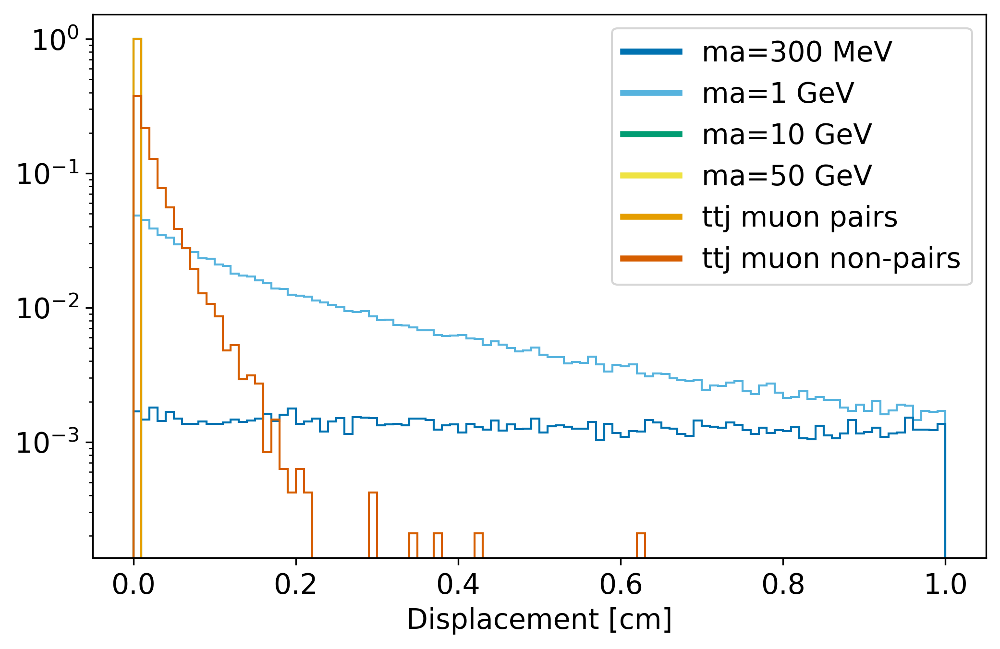

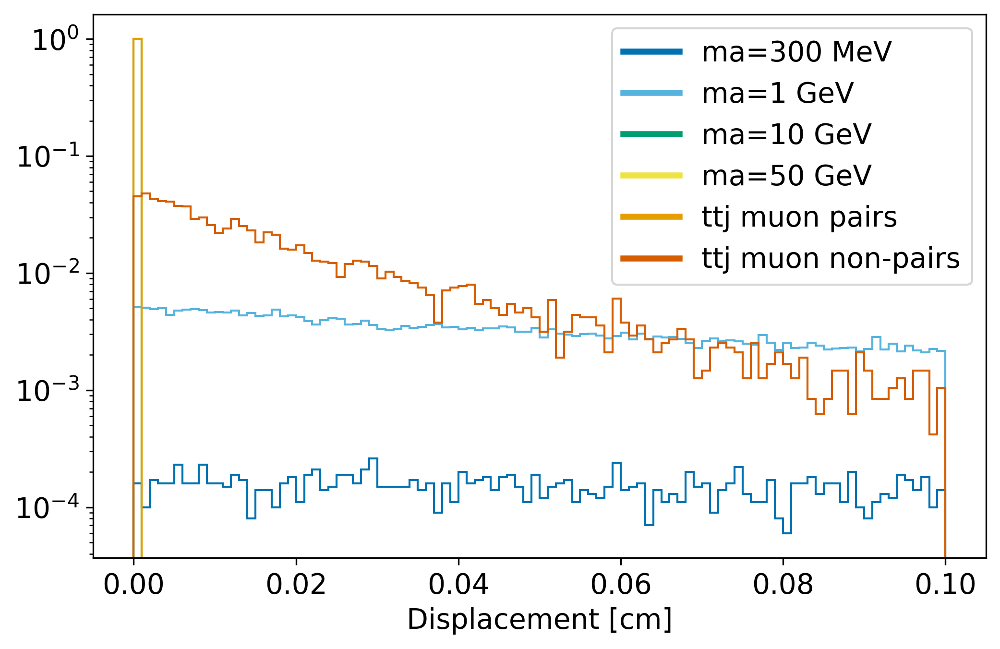

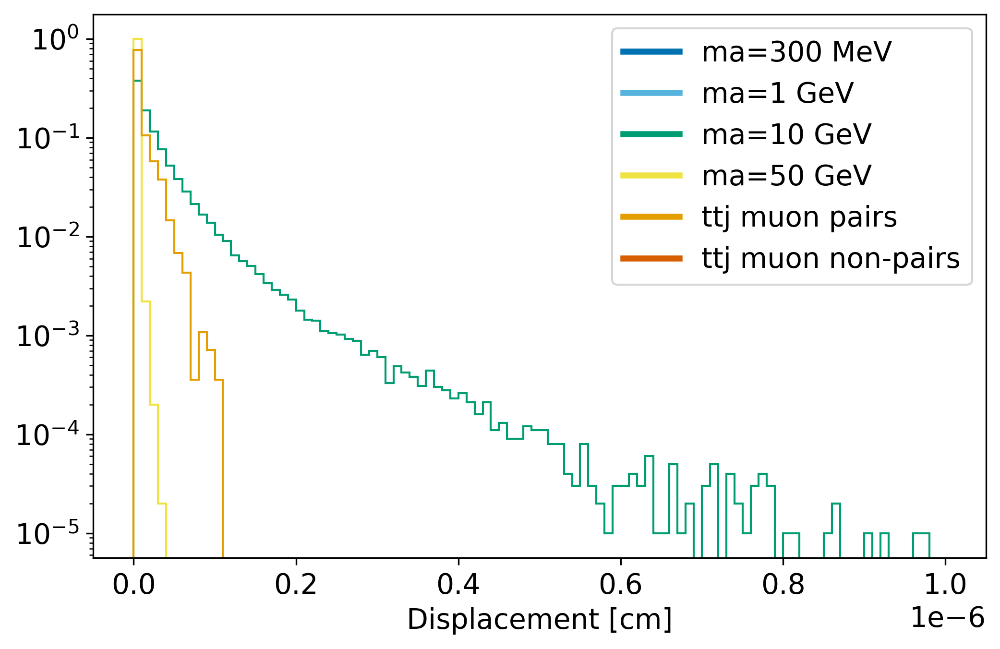

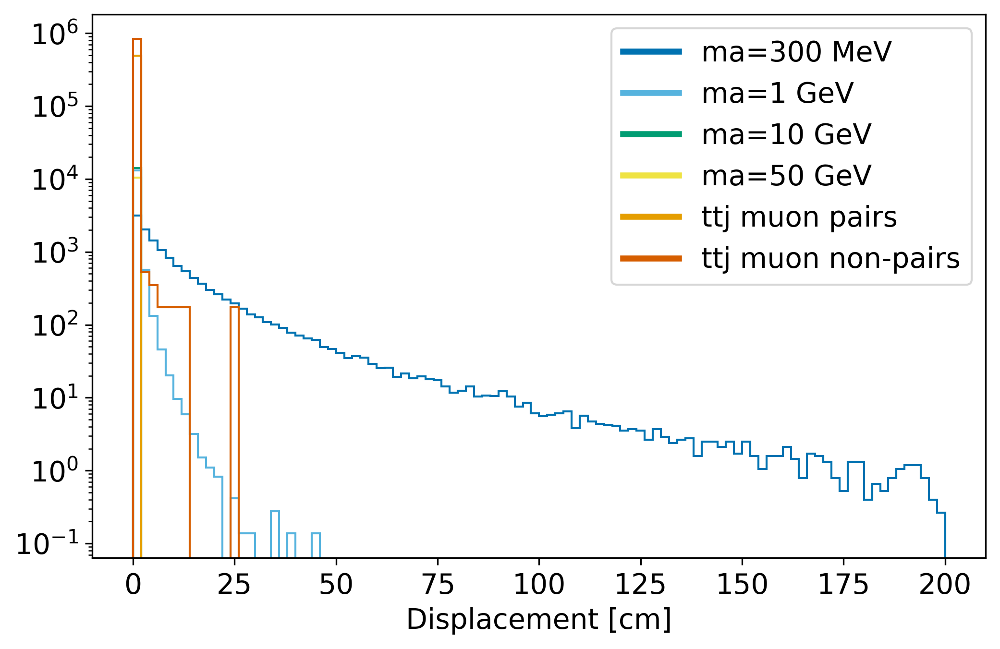

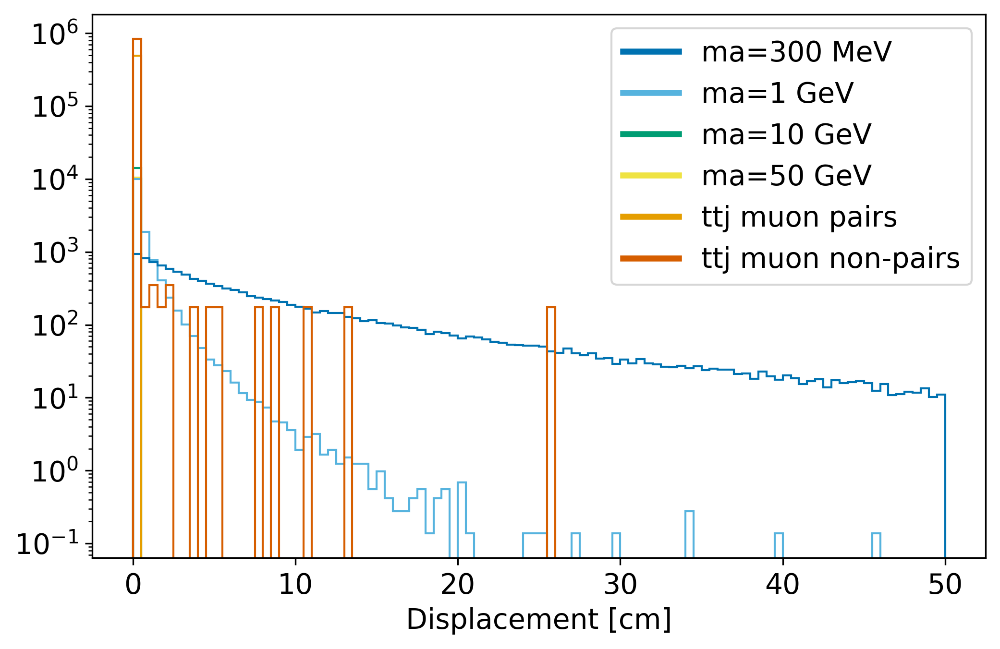

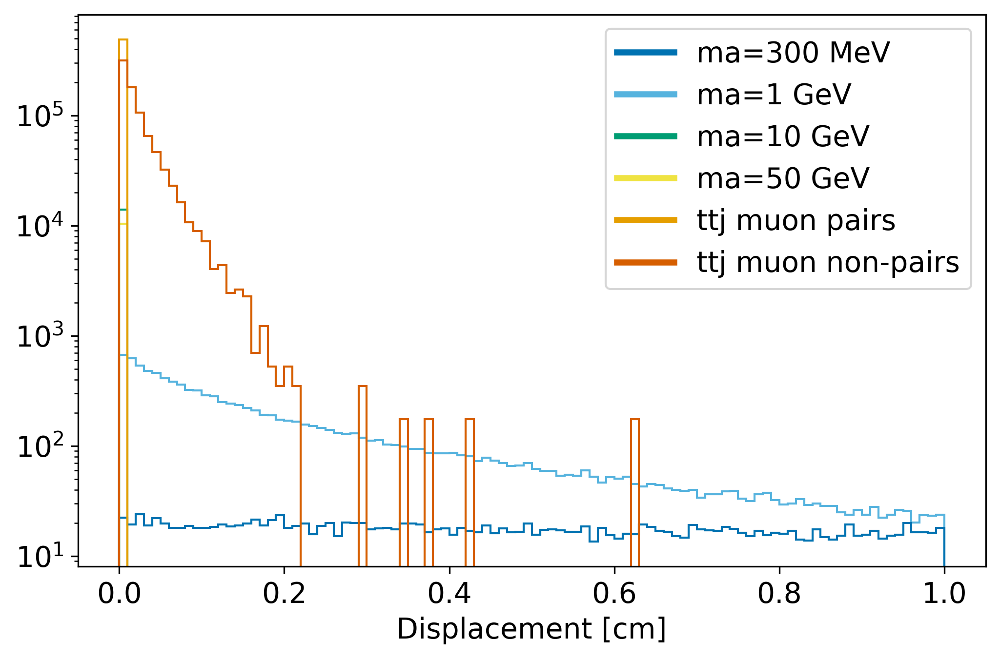

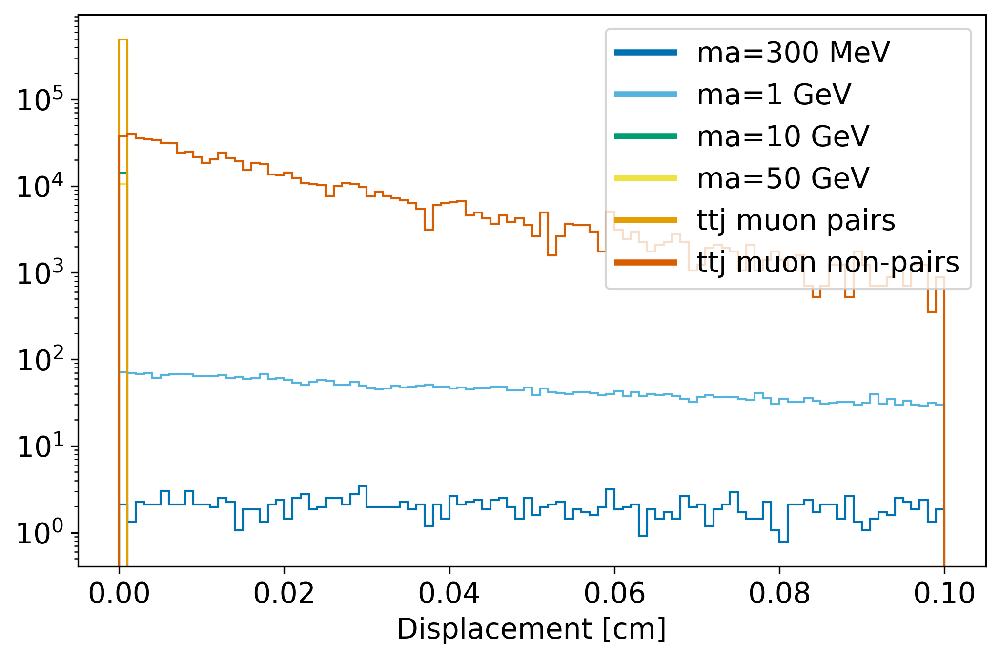

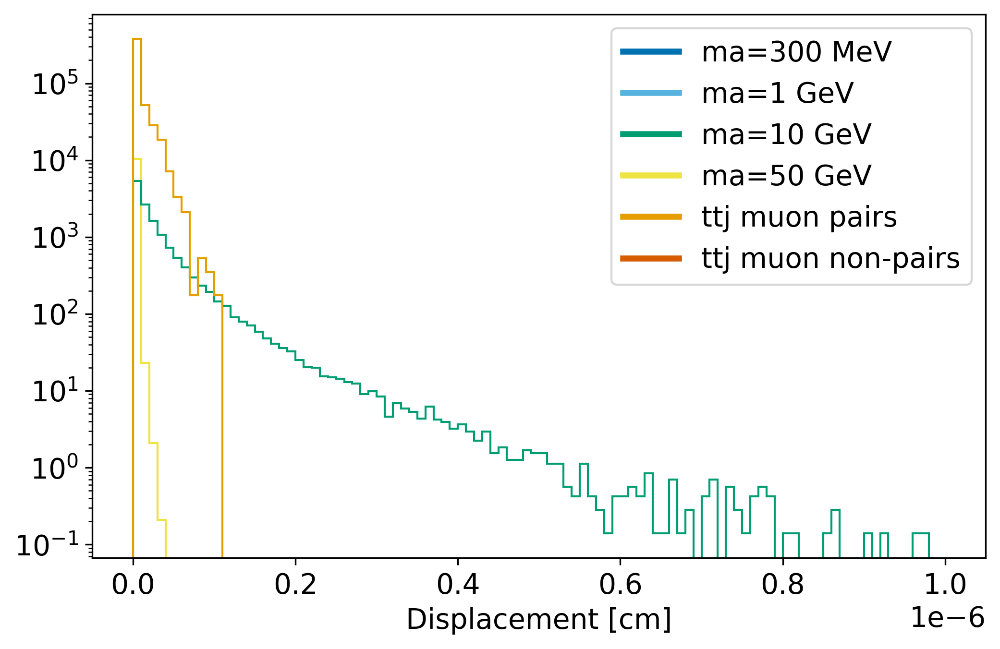

In [126]:
handles = [Line2D([],[],c=cc,lw=3) for cc in colors]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV', 'ttj muon pairs', 'ttj muon non-pairs']

dat_incl = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat_incl[i])*[1/len(dat_incl[i])]) for i in range(len(dat_incl))]
mp_weights = len(mp_decay_lenghts_arr)*[1/len(mp_decay_lenghts_arr)]
sm_weights = len(sm_decay_lenghts_arr)*[1/len(sm_decay_lenghts_arr)]

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

inclusive_weights = [np.array(len(dat_incl[i])*[1/N_incl])*cross_incl[i]*intlumi for i in range(len(dat_incl))]
mp_weights = np.array(len(mp_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi
sm_weights = np.array(len(sm_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

In [138]:
# Make a cut for |eta|<2.5
sel = ((lambda x: abs(x)<2.5),"eta", ["muon"])
data_ttj_pair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair]
data_ttj_nonpair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair]
data_inclusive_e = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive]
sel = ((lambda x: abs(x)<2.5),"eta", ["antimuon"])
data_ttj_pair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_e = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
data_inclusive_e = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive_e]


In [128]:
mp_mothers = data_ttj_pair_e[0].count_muon_mothers()
sm_mothers = data_ttj_nonpair_e[0].count_muon_mothers()
        
mp_decay_lenghts_arr = np.ndarray(shape=(0,0),dtype=int)
sm_decay_lenghts_arr = np.ndarray(shape=(0,0),dtype=int)
for key in decay_lengths:
    scale = decay_lengths[key]
    if key in mp_mothers:
        mp_size = int(mp_mothers[key])
        mp_decay_lenghts_arr = np.append(mp_decay_lenghts_arr, np.random.exponential(scale=scale,size=mp_size))
    if key in sm_mothers:
        sm_size = int(sm_mothers[key])
        sm_decay_lenghts_arr = np.append(sm_decay_lenghts_arr, np.random.exponential(scale=scale,size=sm_size))
        
print(mp_decay_lenghts_arr)
print(len(mp_decay_lenghts_arr))
print(sm_decay_lenghts_arr)
print(len(sm_decay_lenghts_arr))

[3.27654010e-14 3.35139074e-13 1.91296844e-13 ... 5.82458192e-12
 9.07565894e-12 2.86437457e-11]
1220
[0.00081499 0.00472661 0.00118177 ... 0.04601929 0.02986607 0.00896682]
2319


In [ ]:
data_inclusive = data_inclusive_e

handles = [Line2D([],[],c=cc,lw=3) for cc in colors]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV', 'ttj muon pairs', 'ttj muon non-pairs']

dat_incl = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat_incl[i])*[1/len(dat_incl[i])]) for i in range(len(dat_incl))]
mp_weights = len(mp_decay_lenghts_arr)*[1/len(mp_decay_lenghts_arr)]
sm_weights = len(sm_decay_lenghts_arr)*[1/len(sm_decay_lenghts_arr)]

dat_mp = data("c_tau", ["muon"],"")

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

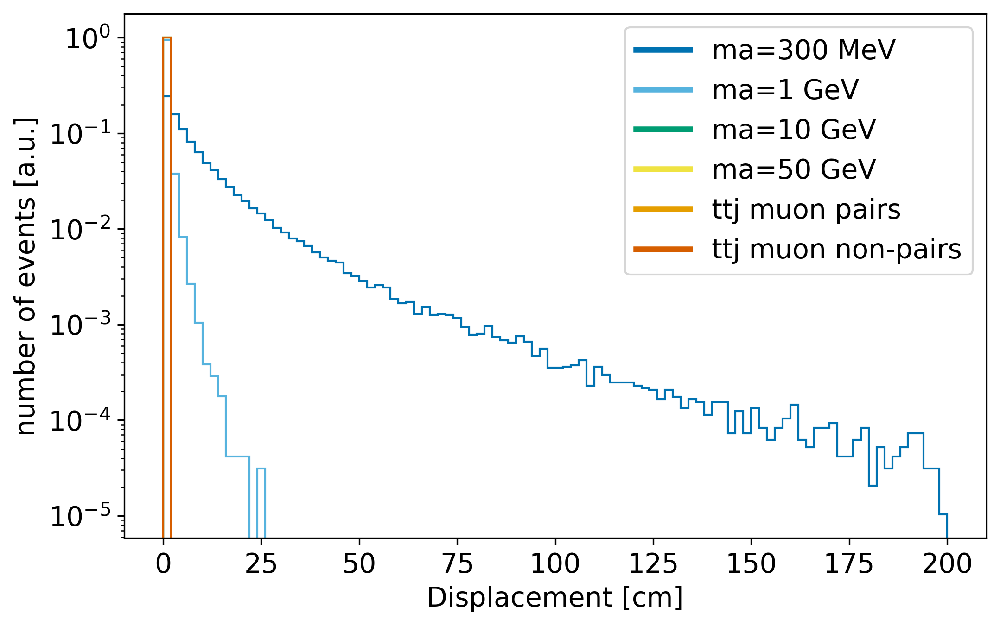

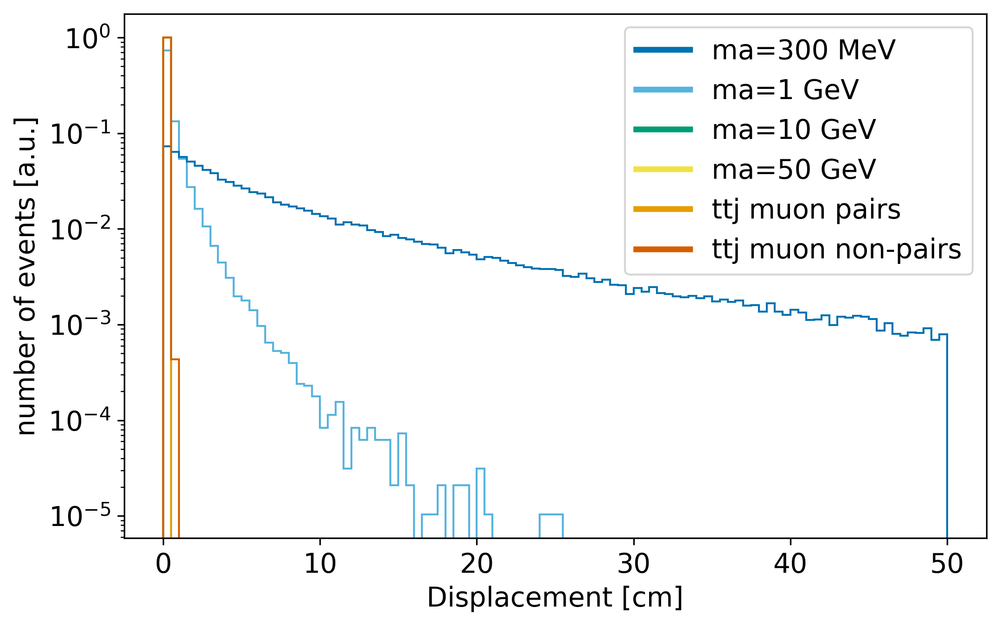

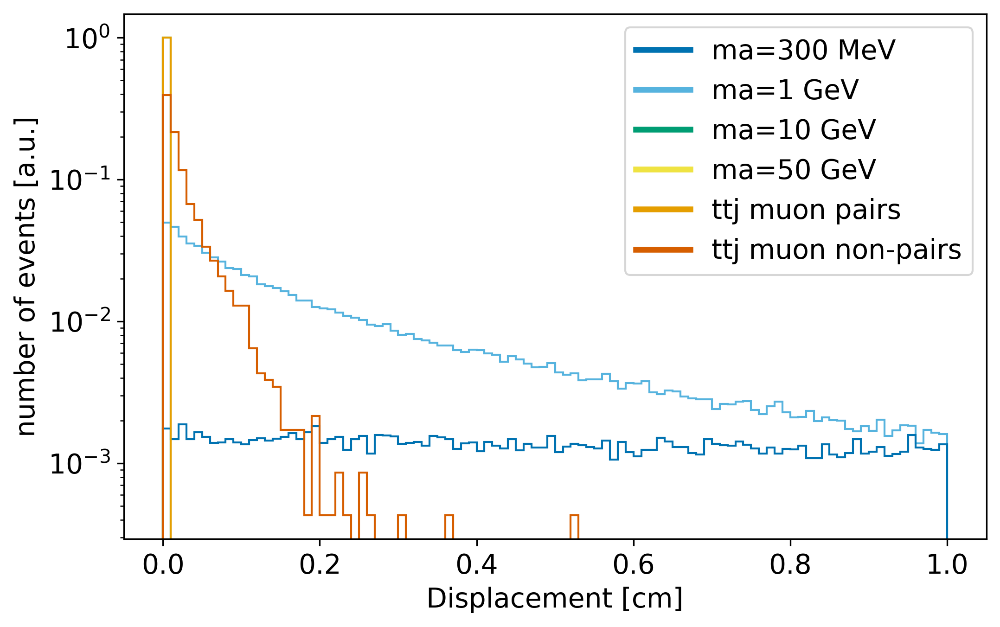

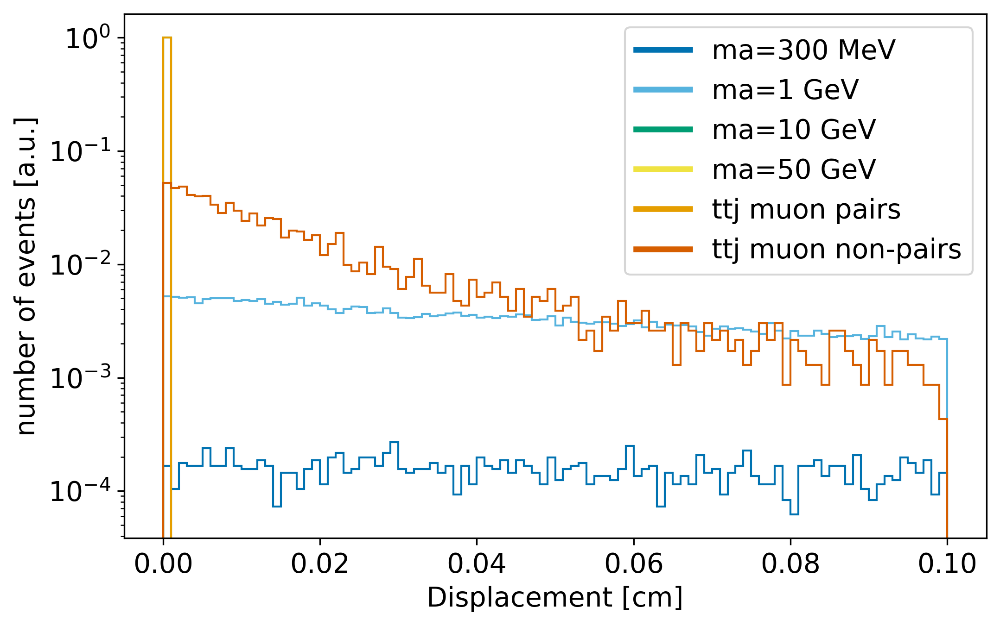

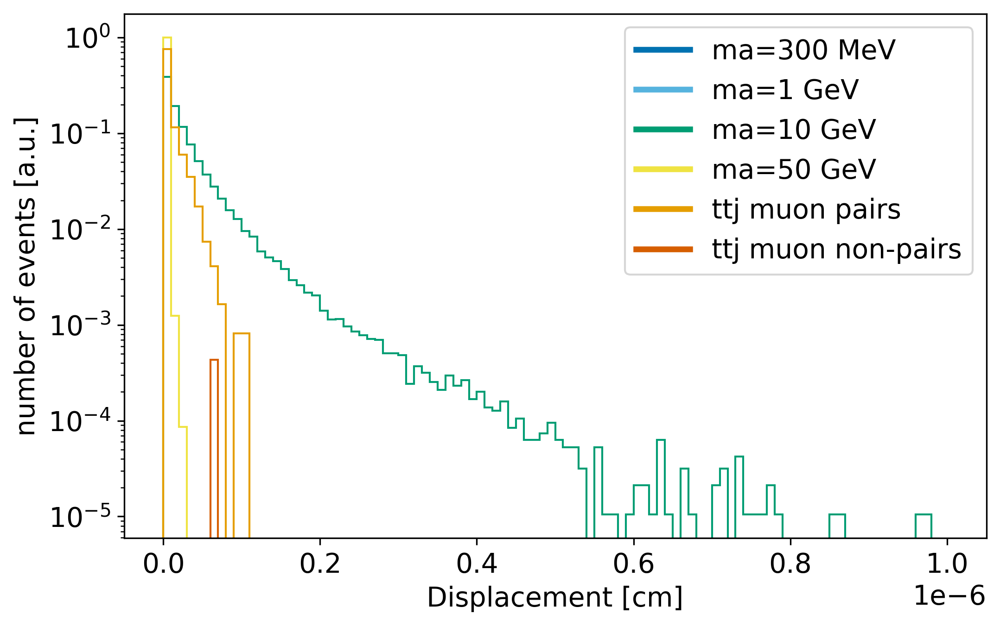

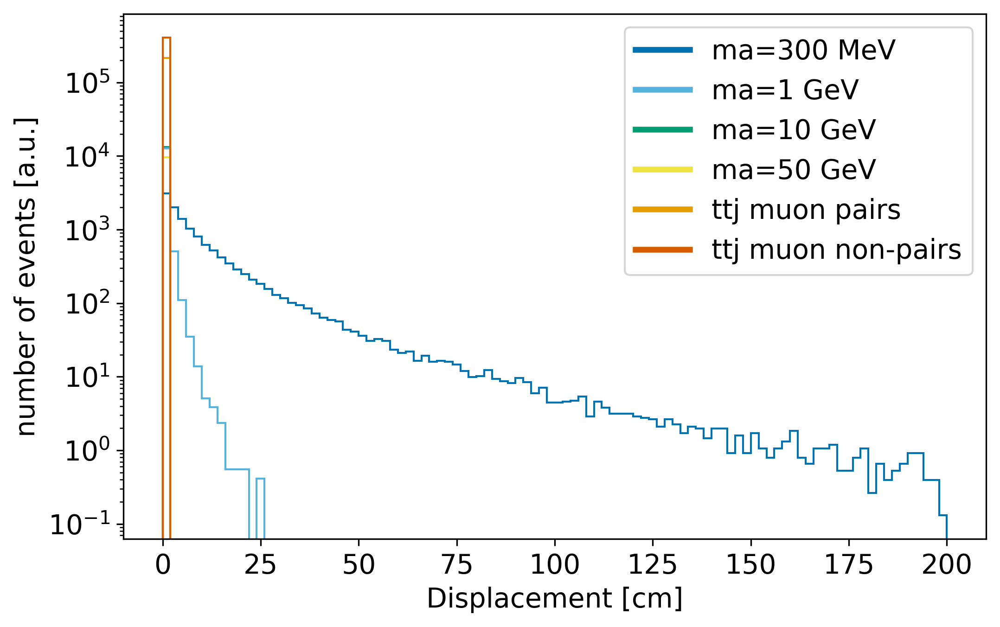

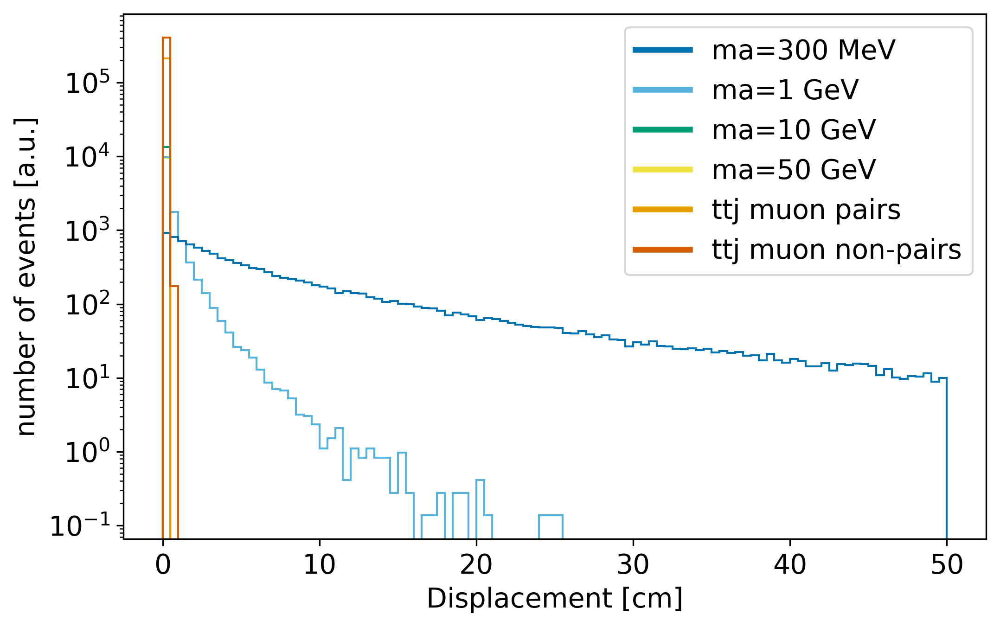

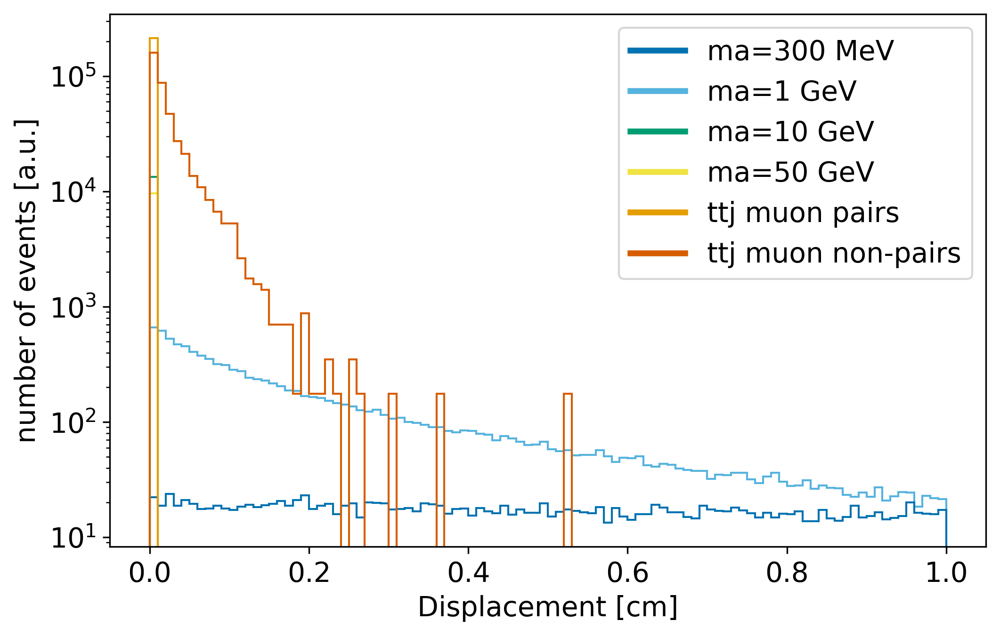

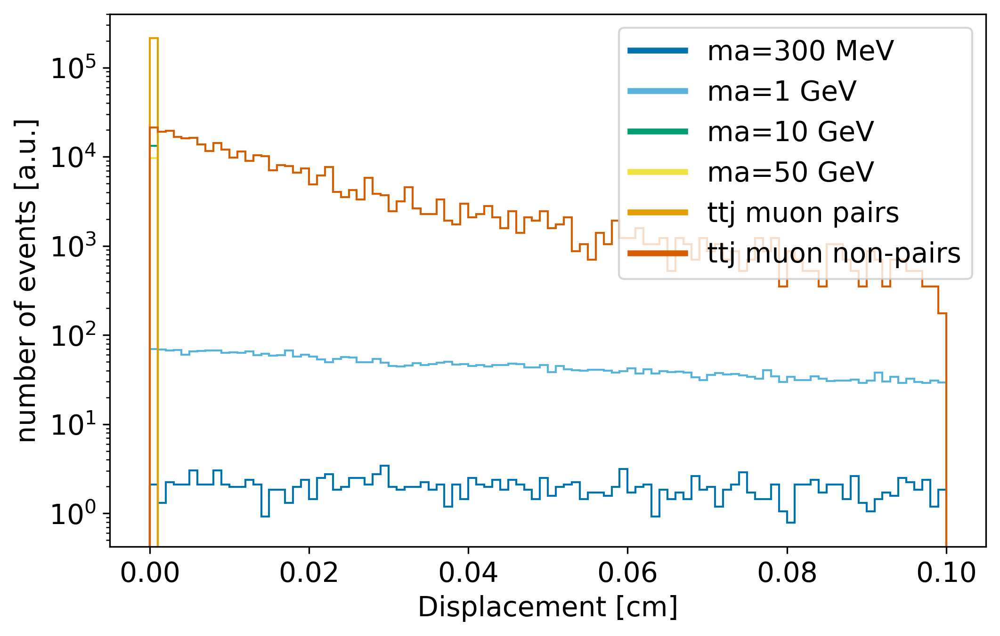

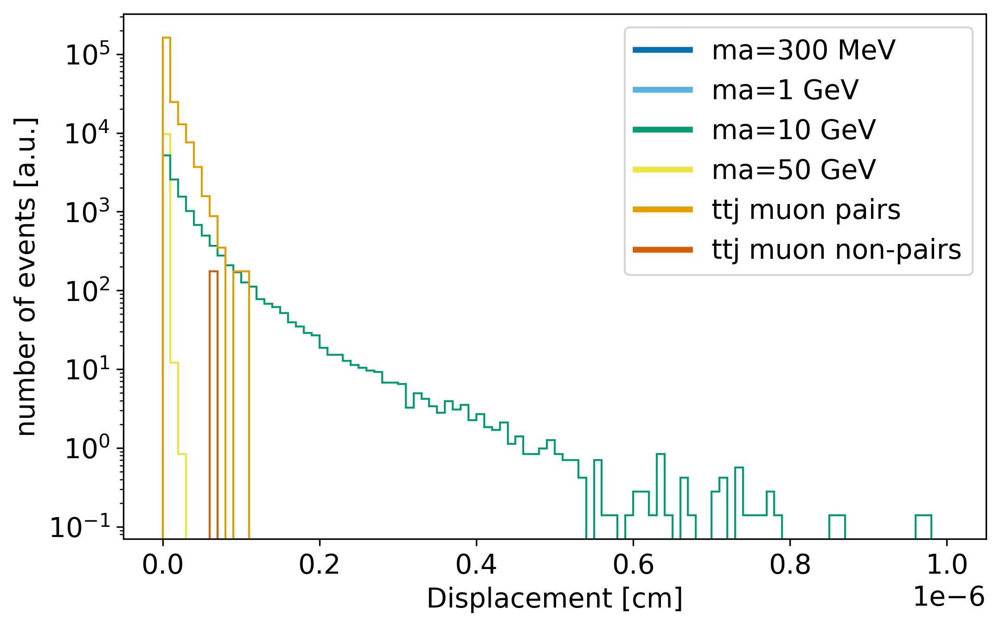

In [129]:
data_inclusive = data_inclusive_e

handles = [Line2D([],[],c=cc,lw=3) for cc in colors]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV', 'ttj muon pairs', 'ttj muon non-pairs']

dat_incl = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat_incl[i])*[1/len(dat_incl[i])]) for i in range(len(dat_incl))]
mp_weights = len(mp_decay_lenghts_arr)*[1/len(mp_decay_lenghts_arr)]
sm_weights = len(sm_decay_lenghts_arr)*[1/len(sm_decay_lenghts_arr)]

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

inclusive_weights = [np.array(len(dat_incl[i])*[1/N_incl])*cross_incl[i]*intlumi for i in range(len(dat_incl))]
mp_weights = np.array(len(mp_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi
sm_weights = np.array(len(sm_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

data_inclusive = data_inclusive_org

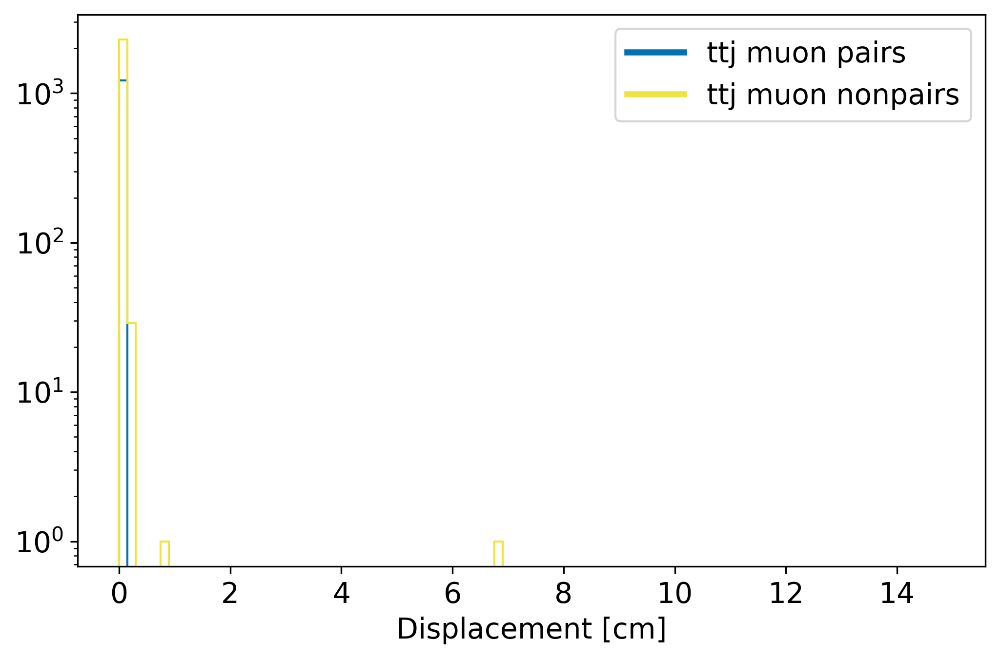

In [84]:
binList = np.arange(0,15,15/100)

handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ttj muon pairs', 'ttj muon nonpairs']

plt.hist(mp_decay_lenghts_arr,color=colors[0],bins=binList,histtype='step')
plt.hist(sm_decay_lenghts_arr,color=colors[3],bins=binList,histtype='step')
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

In [112]:
# Make a cut for pT>10
sel = ((lambda x: x>10),"pT", ["muon"])
data_ttj_pair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_e]
data_ttj_nonpair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_e]
data_inclusive_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive_e]
sel = ((lambda x: x>10),"pT", ["antimuon"])
data_ttj_pair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_pT]
data_ttj_nonpair_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_pT]
data_inclusive_pT = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive_pT]
print(data_ttj_pair_pT)
print(data_ttj_nonpair_pT)
print(data_inclusive_pT)

# Make a cut deltaR>0.2
sel = ((lambda x: x>0.2),"deltaR", ["muon","antimuon"])
data_ttj_pair_dR = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_pair_pT]
data_ttj_nonpair_dR = [dc.Dataset.event_selection(ds,sel) for ds in data_ttj_nonpair_pT]
data_inclusive_dR = [dc.Dataset.event_selection(ds,sel) for ds in data_inclusive_pT]

print(data_ttj_pair_dR)
print(data_ttj_nonpair_dR)
print(data_inclusive_dR)


[This Dataset contains 2 events.]
[This Dataset contains 13 events.]
[This Dataset contains 87495 events., This Dataset contains 73354 events., This Dataset contains 71957 events., This Dataset contains 81095 events.]
[This Dataset contains 2 events.]
[This Dataset contains 13 events.]
[This Dataset contains 24836 events., This Dataset contains 62586 events., This Dataset contains 71397 events., This Dataset contains 81090 events.]


In [113]:
mp_mothers = data_ttj_pair_dR[0].count_muon_mothers()
sm_mothers = data_ttj_nonpair_dR[0].count_muon_mothers()
        
mp_decay_lenghts_arr = np.ndarray(shape=(0,0),dtype=int)
sm_decay_lenghts_arr = np.ndarray(shape=(0,0),dtype=int)
for key in decay_lengths:
    scale = decay_lengths[key]
    if key in mp_mothers:
        mp_size = int(mp_mothers[key])
        mp_decay_lenghts_arr = np.append(mp_decay_lenghts_arr, np.random.exponential(scale=scale,size=mp_size))
    if key in sm_mothers:
        sm_size = int(sm_mothers[key])
        sm_decay_lenghts_arr = np.append(sm_decay_lenghts_arr, np.random.exponential(scale=scale,size=sm_size))
        
print(mp_decay_lenghts_arr)
print(len(mp_decay_lenghts_arr))
print(sm_decay_lenghts_arr)
print(len(sm_decay_lenghts_arr))

[1.44438966e-13 2.37446089e-13 8.13387532e-11 1.07767678e-11]
4
[4.19511524e-04 4.11059985e-02 3.40453403e-04 4.28291765e-02
 3.99933392e-03 3.02080660e-02 6.18160034e-03 5.65475381e-03
 1.42616129e-03 1.65585072e-02 3.29583393e-02 7.50203011e-02
 4.11378386e-02 1.38604691e-04 5.56510950e-05 4.98843700e-02
 2.12629842e-02 2.14651749e-01 6.79172073e-03 4.92285587e-02
 5.03004375e-02 2.28569496e-02]
22


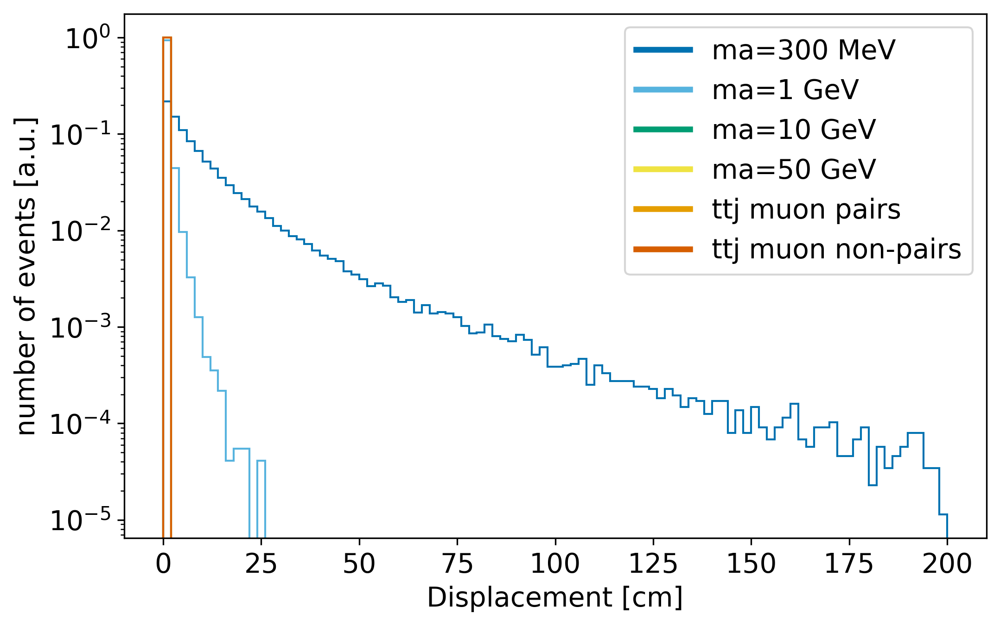

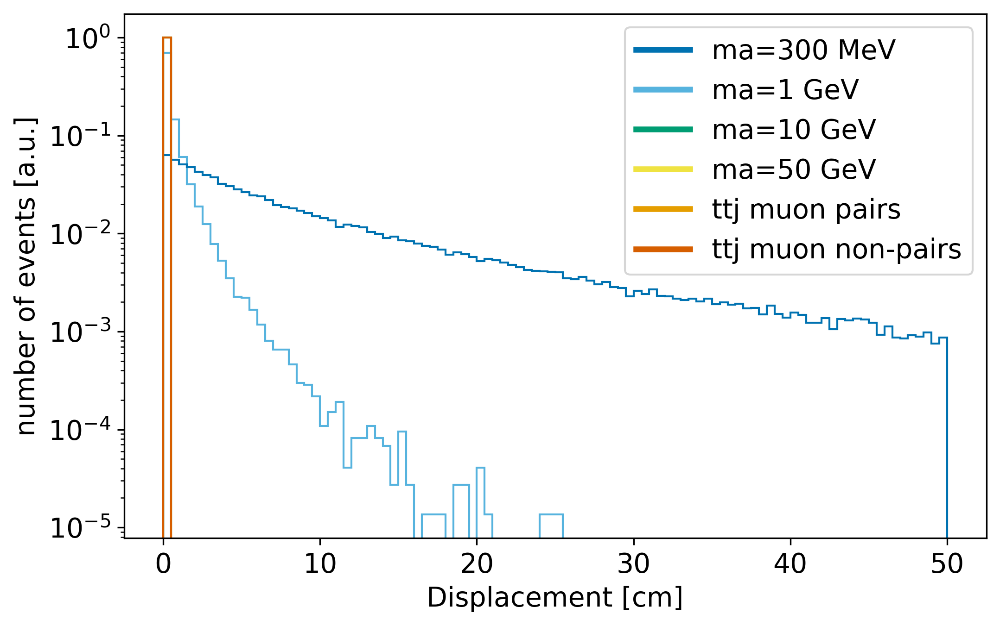

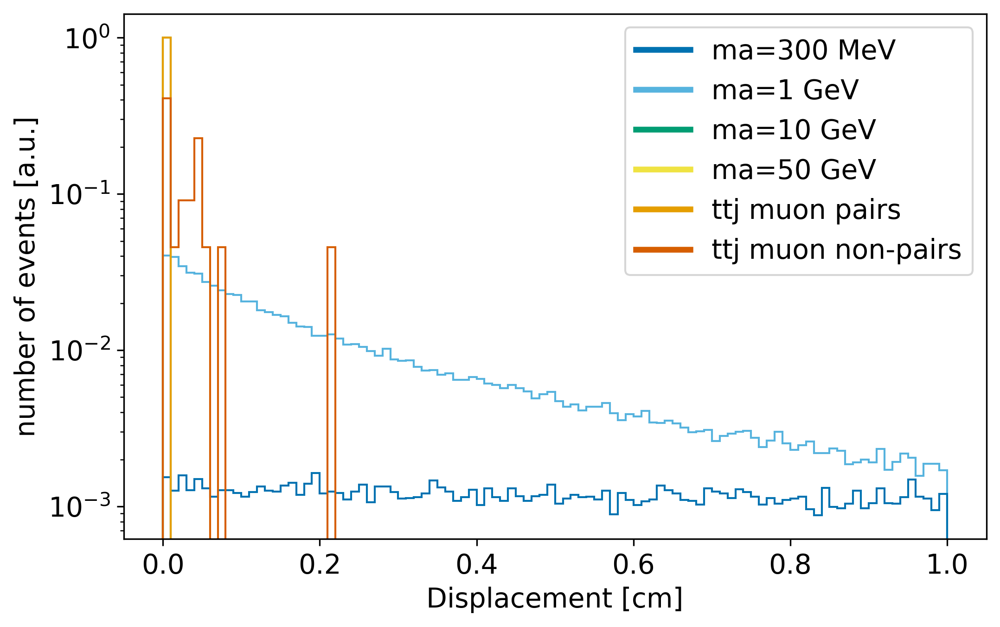

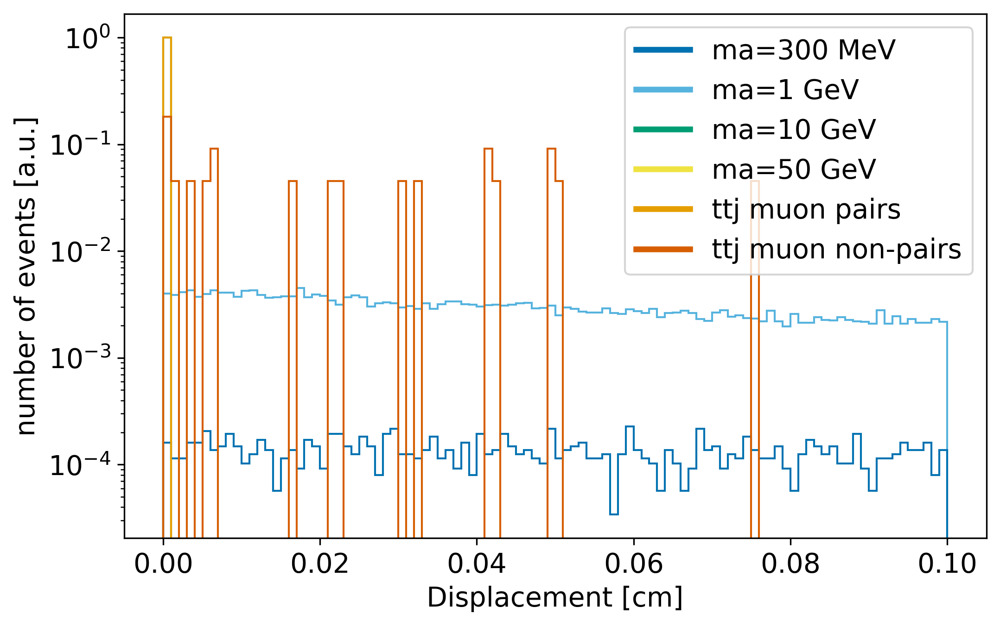

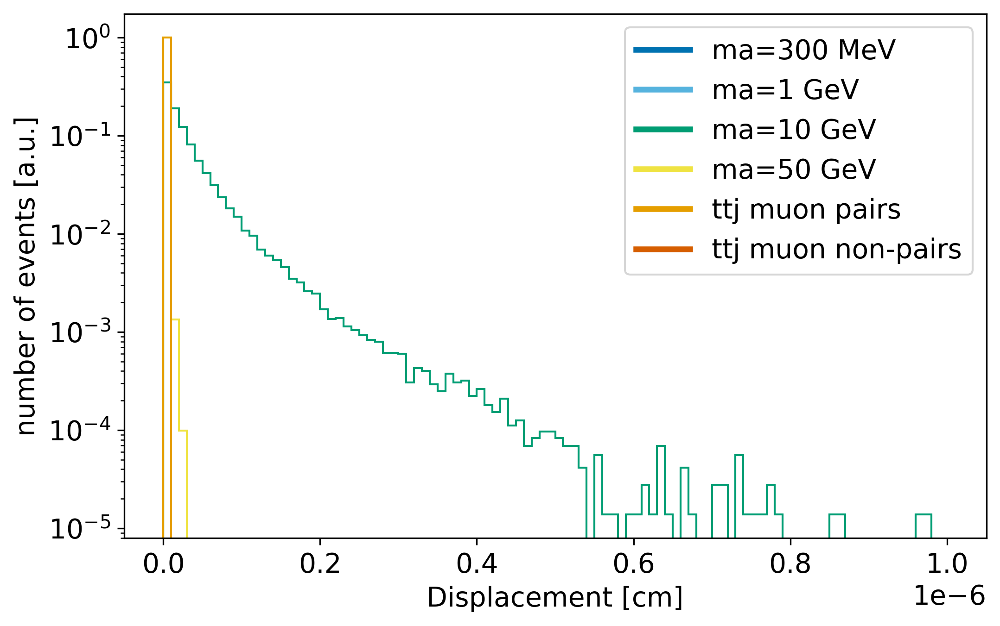

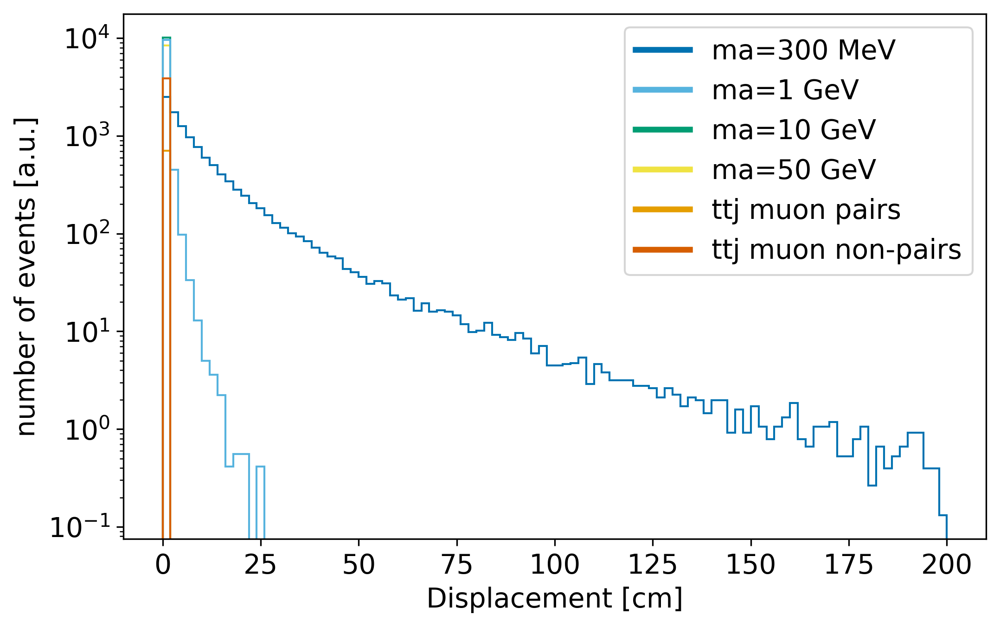

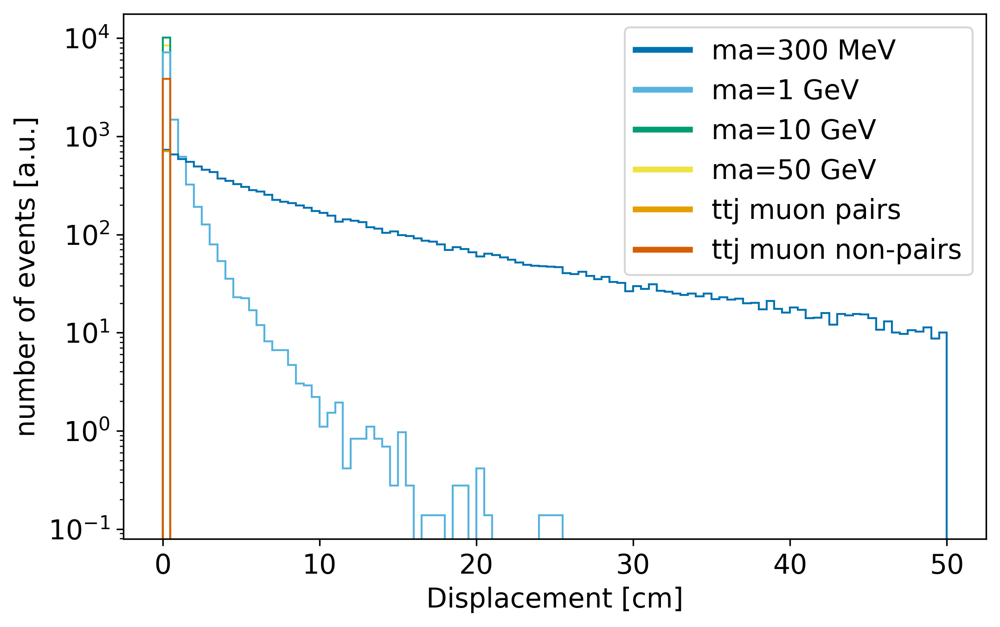

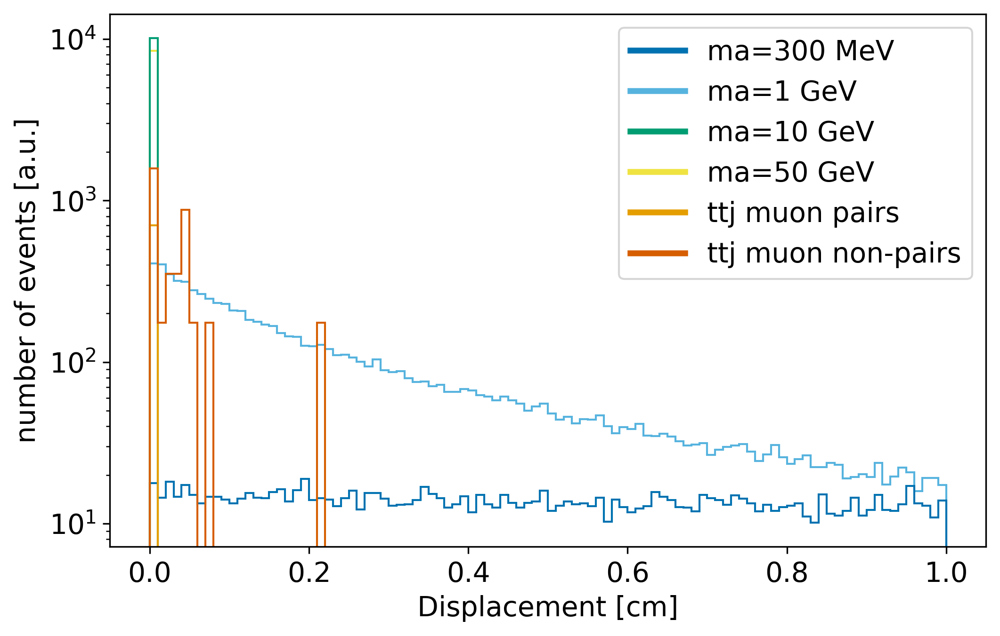

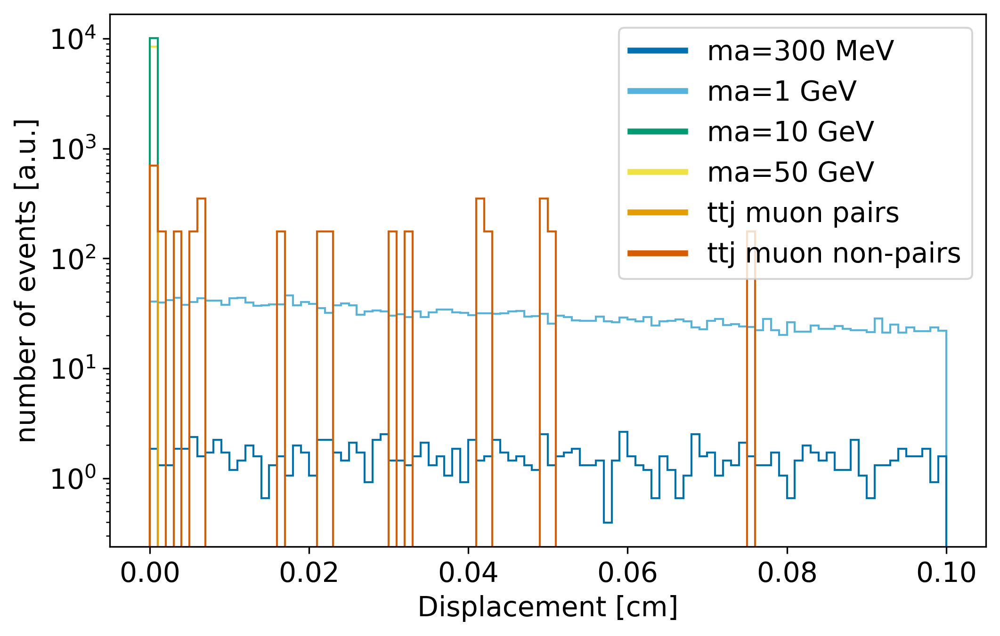

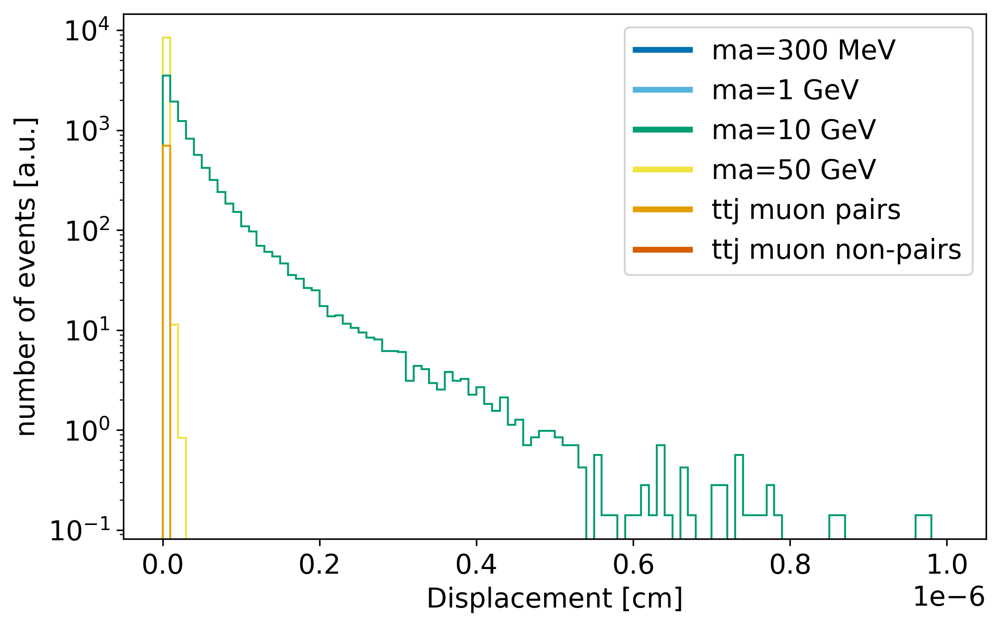

In [120]:
data_inclusive = data_inclusive_pT

handles = [Line2D([],[],c=cc,lw=3) for cc in colors]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV', 'ttj muon pairs', 'ttj muon non-pairs']

dat_incl = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat_incl[i])*[1/len(dat_incl[i])]) for i in range(len(dat_incl))]
mp_weights = len(mp_decay_lenghts_arr)*[1/len(mp_decay_lenghts_arr)]
sm_weights = len(sm_decay_lenghts_arr)*[1/len(sm_decay_lenghts_arr)]

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

inclusive_weights = [np.array(len(dat_incl[i])*[1/N_incl])*cross_incl[i]*intlumi for i in range(len(dat_incl))]
mp_weights = np.array(len(mp_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi
sm_weights = np.array(len(sm_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.ylabel("number of events [a.u.]")
plt.yscale('log')

data_inclusive = data_inclusive_org

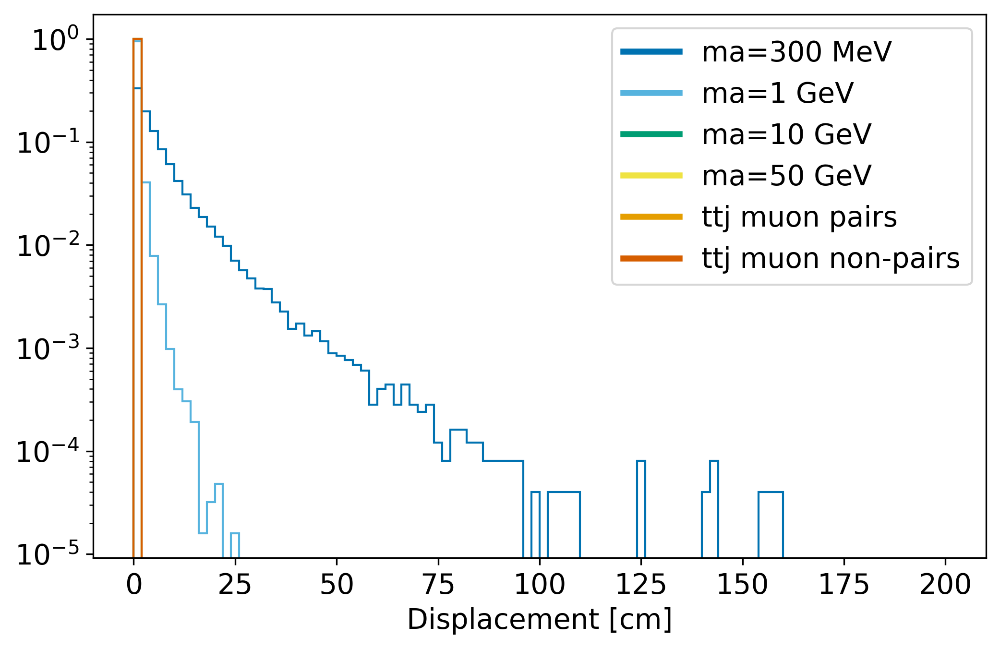

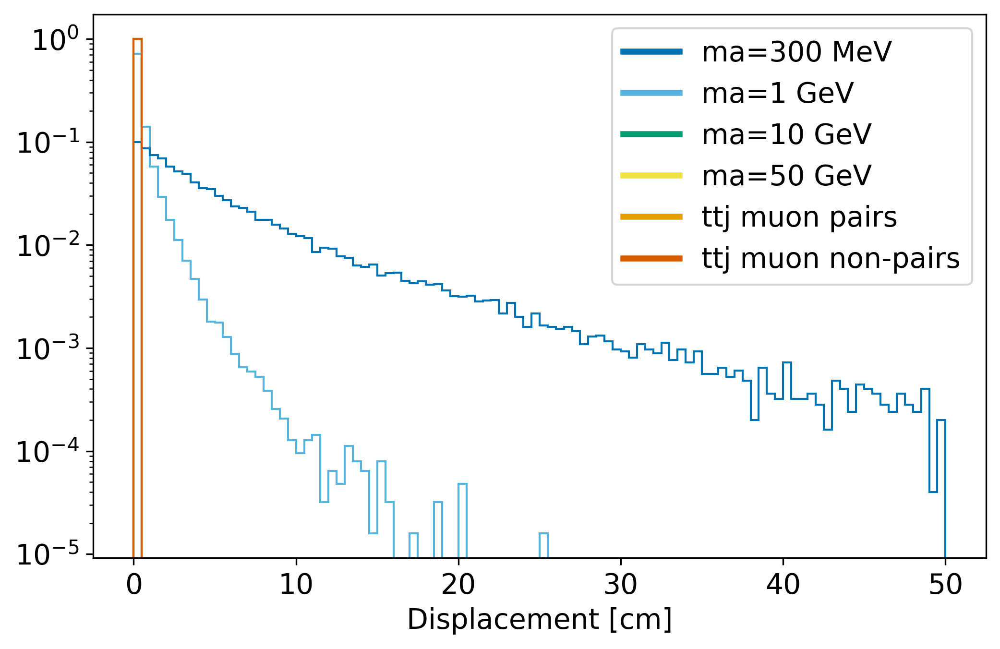

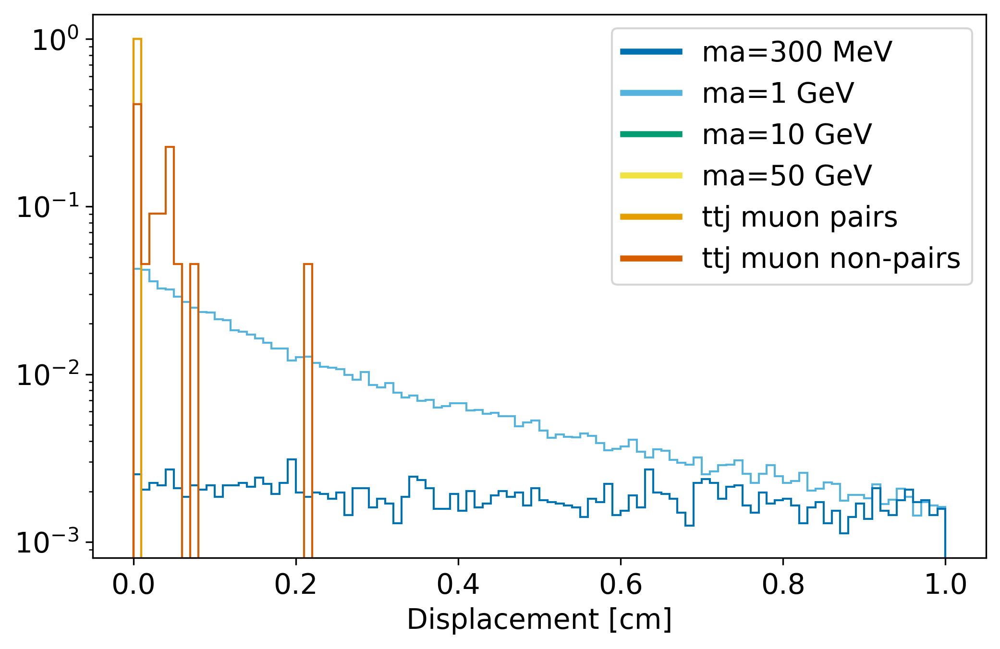

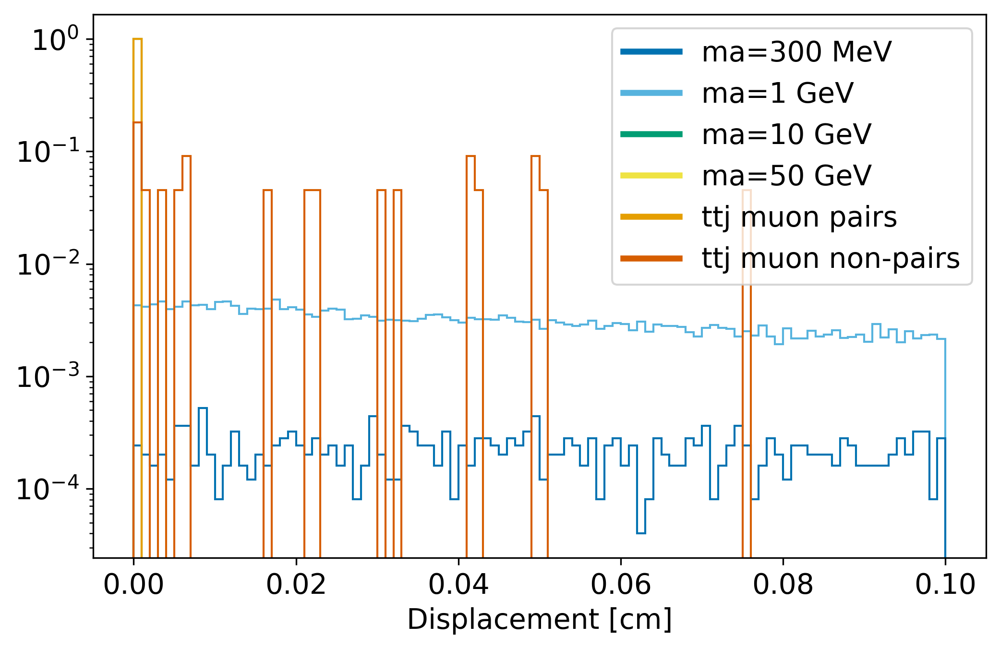

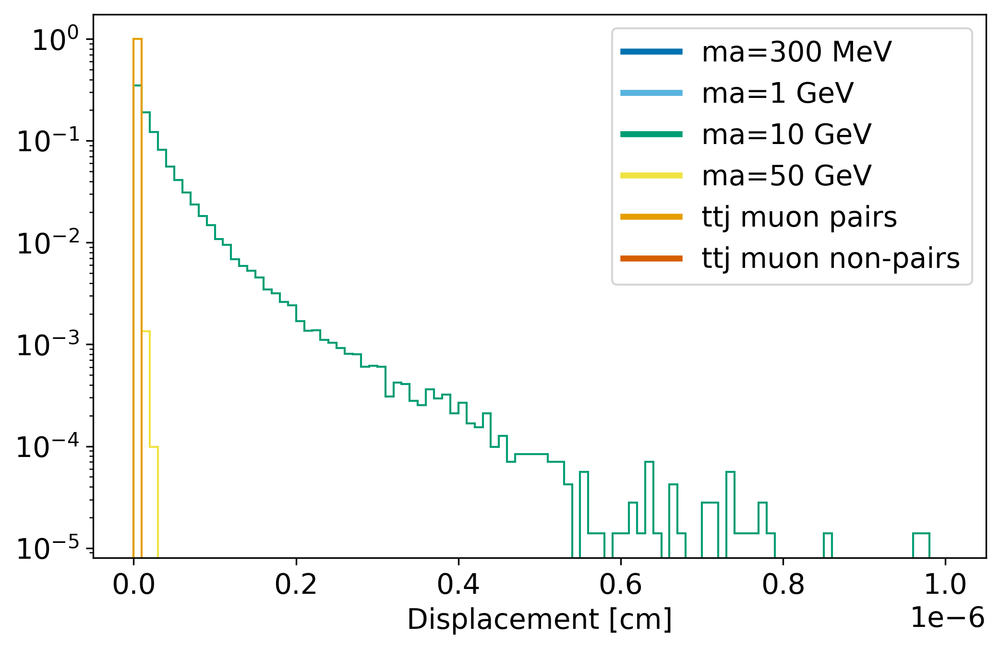

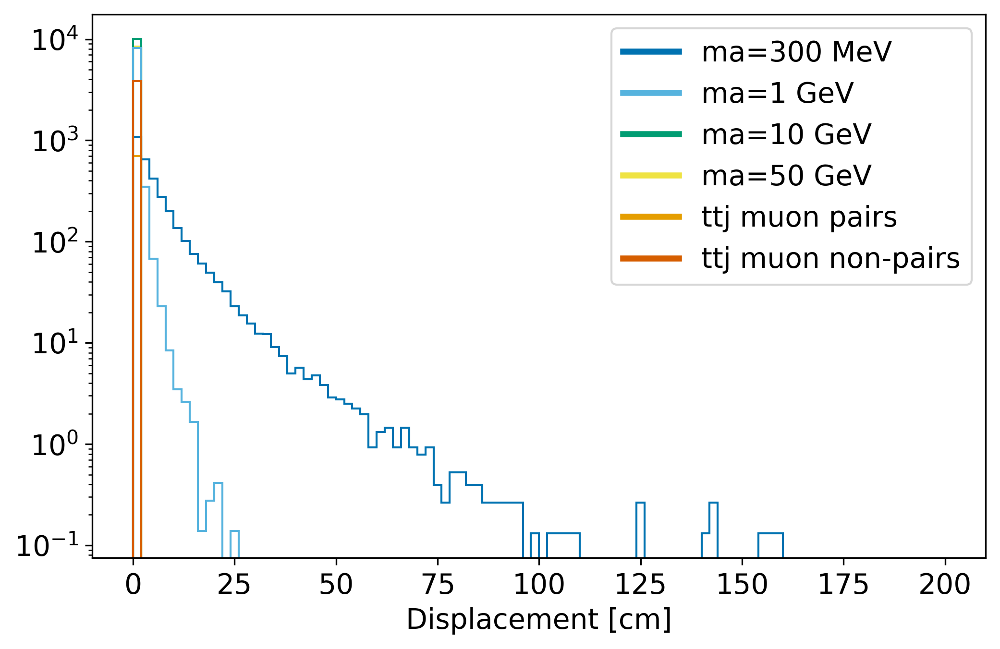

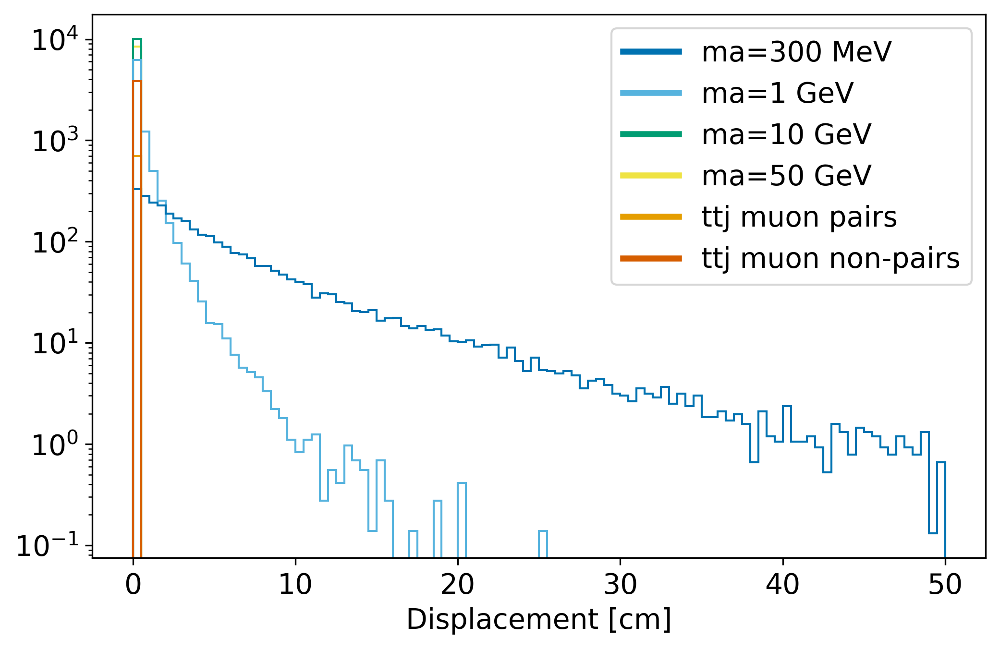

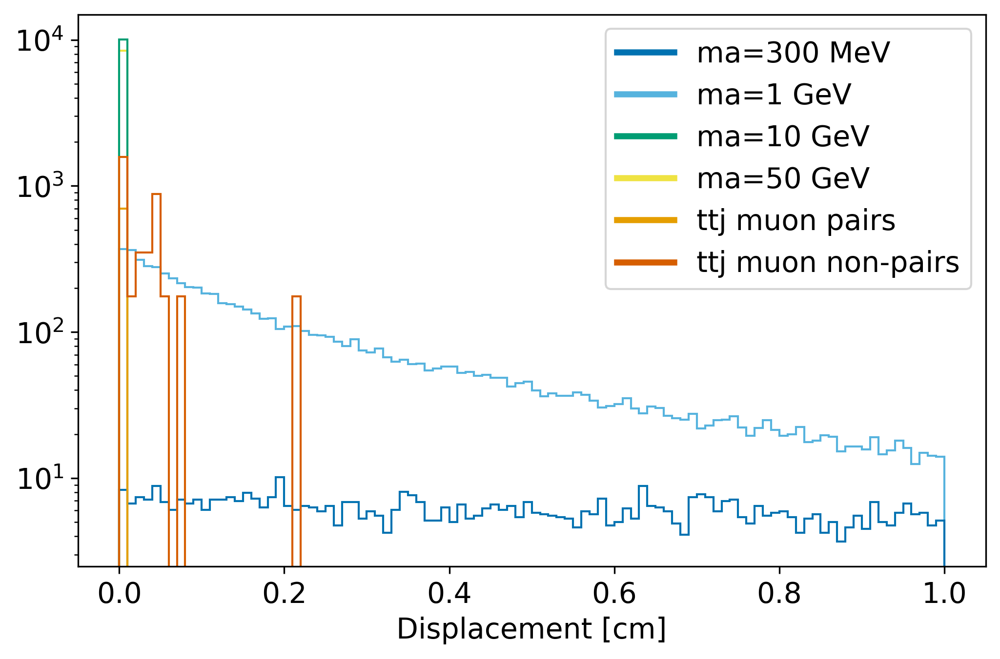

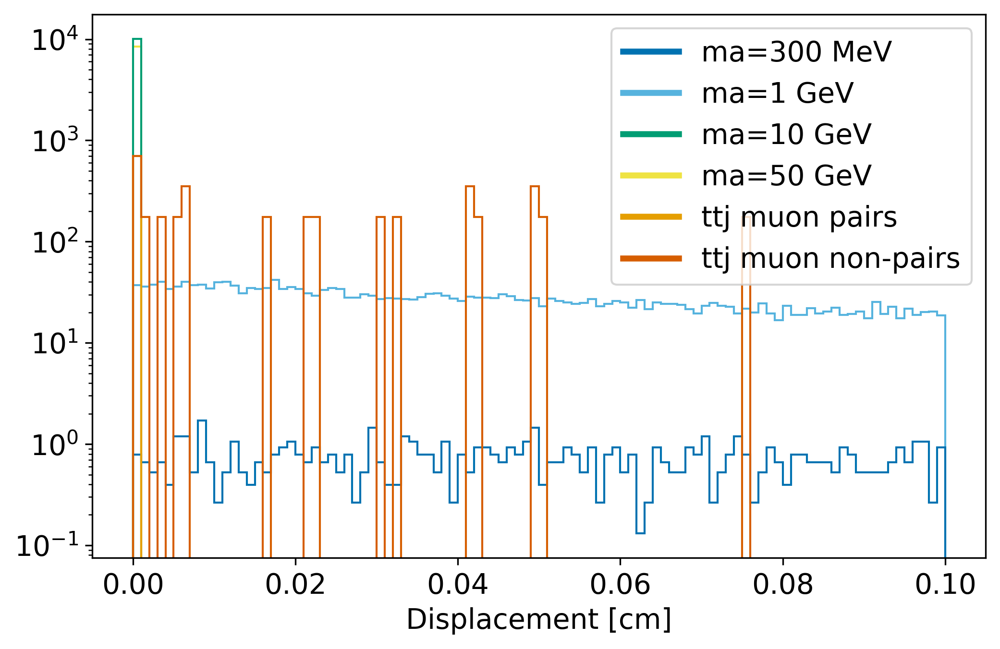

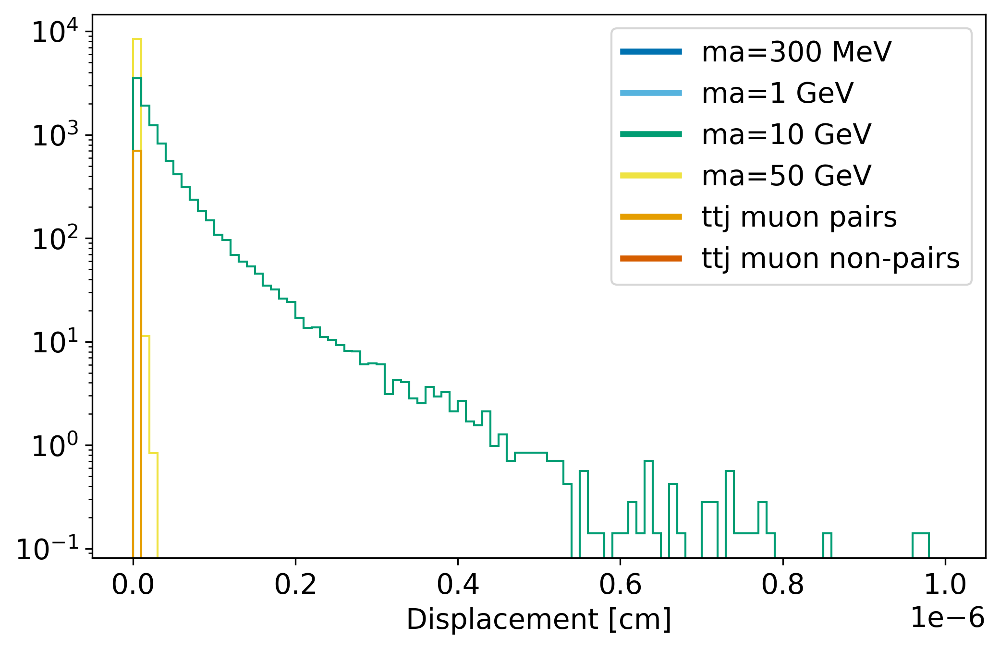

In [115]:
data_inclusive = data_inclusive_dR

handles = [Line2D([],[],c=cc,lw=3) for cc in colors]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV', 'ttj muon pairs', 'ttj muon non-pairs']

dat_incl = data("c_tau",["muon"],"incl")
inclusive_weights = [(len(dat_incl[i])*[1/len(dat_incl[i])]) for i in range(len(dat_incl))]
mp_weights = len(mp_decay_lenghts_arr)*[1/len(mp_decay_lenghts_arr)]
sm_weights = len(sm_decay_lenghts_arr)*[1/len(sm_decay_lenghts_arr)]

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

inclusive_weights = [np.array(len(dat_incl[i])*[1/N_incl])*cross_incl[i]*intlumi for i in range(len(dat_incl))]
mp_weights = np.array(len(mp_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi
sm_weights = np.array(len(sm_decay_lenghts_arr)*[1/N_ttj])*cross_ttj*intlumi

xmax = 200
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 50
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 0.1
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

xmax = 1e-6
binList = np.arange(0,xmax+xmax/100,xmax/100)
plt.figure()
plt.hist(dat_incl,color=colors[0:4],bins=binList,histtype='step',weights=inclusive_weights)
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step',weights=mp_weights)
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step',weights=sm_weights)
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

data_inclusive = data_inclusive_org

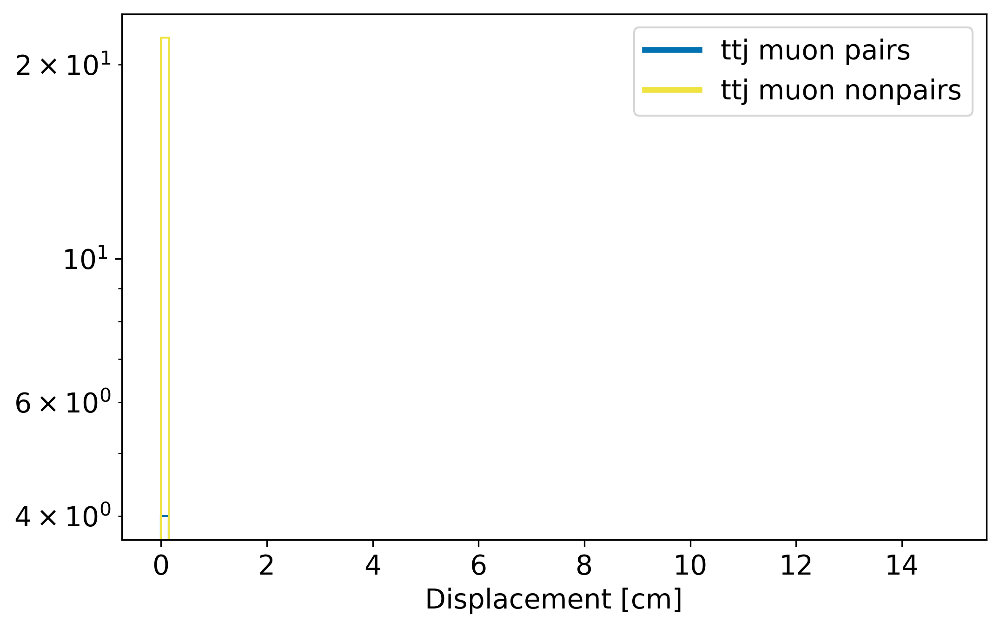

In [89]:
binList = np.arange(0,15,15/100)

handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ttj muon pairs', 'ttj muon nonpairs']

plt.hist(mp_decay_lenghts_arr,color=colors[0],bins=binList,histtype='step')
plt.hist(sm_decay_lenghts_arr,color=colors[3],bins=binList,histtype='step')
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

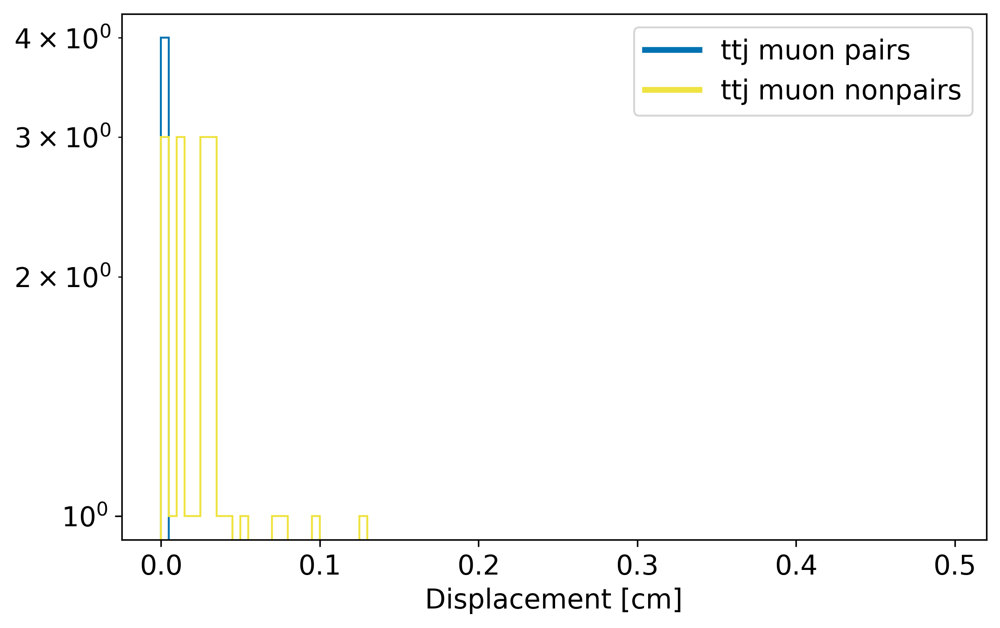

In [90]:
binList = np.arange(0,0.5,0.5/100)

handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ttj muon pairs', 'ttj muon nonpairs']

plt.hist(mp_decay_lenghts_arr,color=colors[0],bins=binList,histtype='step')
plt.hist(sm_decay_lenghts_arr,color=colors[3],bins=binList,histtype='step')
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

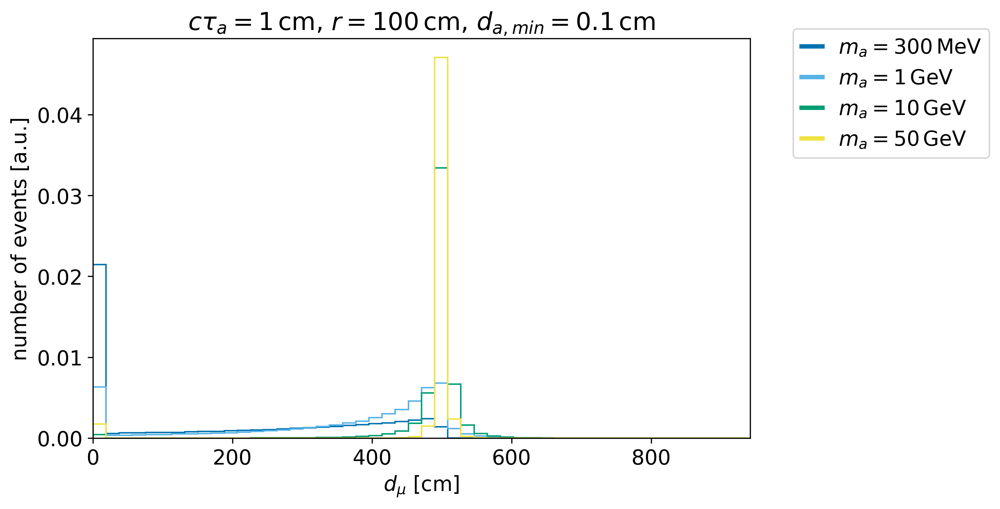

In [122]:
mypl.hist1d(data("track_from_ctau",["alp","muon"],"incl",radius=500,ctau=1,minimum_displacement=0.1),massLabels,dirLabel["track_mu"],title=r"$c\tau_a=1\,$cm, $r=100\,$cm, $d_{a, min}=0.1\,$cm")

/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:182: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:234: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:253: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)
/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/physics.py:215: ComplexWarning: Casting complex values to real discards the imaginary part
  return float(gamma)


FileNotFoundError: [Errno 2] No such file or directory: '/afs/cern.ch/user/l/lrygaard/private/ALPpheno/ttalps/output/lifetimes.png'

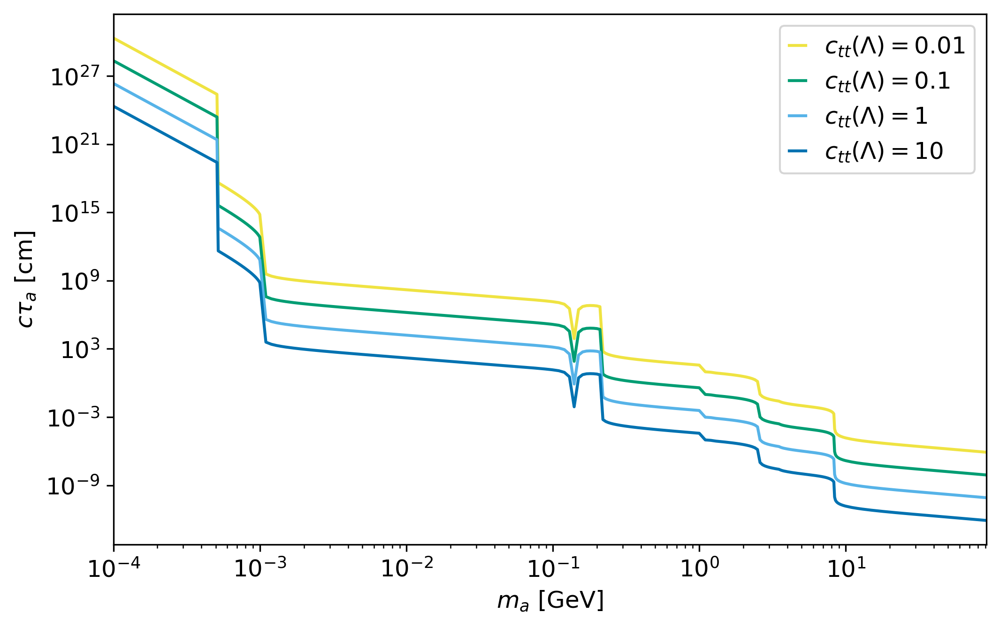

In [126]:
plt.rcParams.update({'font.size': 12})
with aux.HiddenPrints():
    maList = list((i*10**(exp-2) for exp in range(-3, 4) for i in range(10, 100)))
    ctaus = [[],[],[],[]]
    maPlotList = []
    for ma in maList:
        if ma >= 92:
            break
        maPlotList.append(ma)
        ctaus[0].append(ph.ctaua(ma, 10,0, 4 * math.pi *1000))
        ctaus[1].append(ph.ctaua(ma, 1,0, 4 * math.pi *1000))
        ctaus[2].append(ph.ctaua(ma, 0.1,0, 4 * math.pi *1000))
        ctaus[3].append(ph.ctaua(ma, 0.01,0, 4 * math.pi *1000))
    fig, ax = plt.subplots() 
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(r'$m_a$ [GeV]')
    ax.set_ylabel(r'$c\tau_a$ [cm]')
    ax.plot(maPlotList,ctaus[3],color=mypl.coloursX(1,4)[3],label=r"$c_{tt}(\Lambda)=0.01$")
    ax.plot(maPlotList,ctaus[2],color=mypl.coloursX(1,4)[2],label=r"$c_{tt}(\Lambda)=0.1$")
    ax.plot(maPlotList,ctaus[1],color=mypl.coloursX(1,4)[1],label=r"$c_{tt}(\Lambda)=1$")
    ax.plot(maPlotList,ctaus[0],color=mypl.coloursX(1,4)[0],label=r"$c_{tt}(\Lambda)=10$")
    ax.set_xlim([maPlotList[0],maPlotList[-1]])
    plt.legend(handlelength=0.7)
plt.show()

NameError: name 'mp_decay_lenghts_arr' is not defined

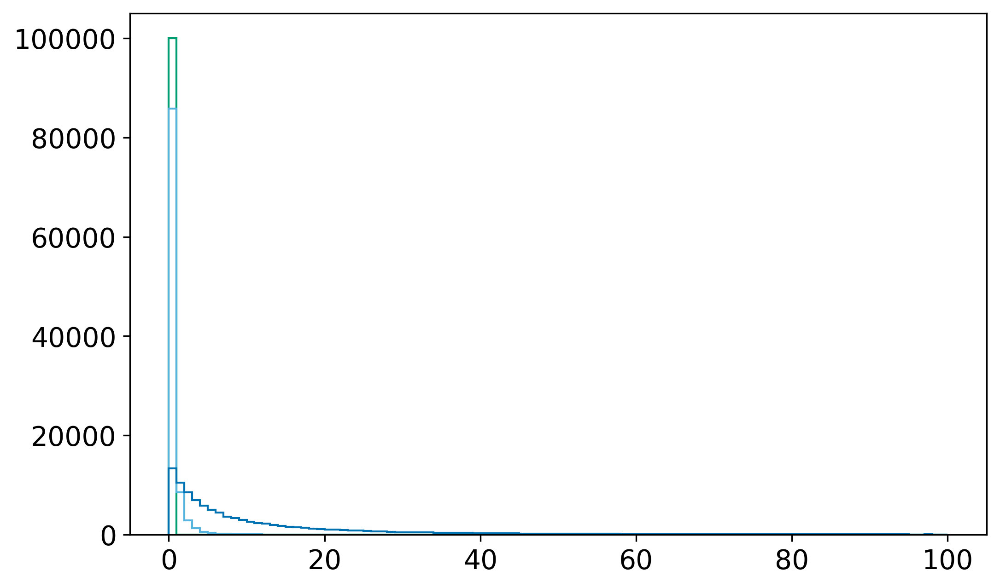

In [31]:
xmax = 100
binList = np.arange(0,xmax+xmax/100,xmax/100)

handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[1],lw=3),Line2D([],[],c=colors[2],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV']

plt.hist(data("c_tau",["muon"],"incl"),color=colors[0:4],bins=binList,histtype='step')
plt.hist(mp_decay_lenghts_arr,color=colors[4],bins=binList,histtype='step')
plt.hist(sm_decay_lenghts_arr,color=colors[5],bins=binList,histtype='step')
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

In [138]:
maList = [0.3,1,10,50]
with aux.HiddenPrints():
    #ctaus = [[],[],[],[]]
    ctau = []
    for ma in maList:
        ctau.append(ph.ctaua(ma, 0.5,-0.5, 4 * math.pi *1000))
print(ctau)

N = 10000
ctau_0p3 = np.random.exponential(scale=ctau[0],size=N)
ctau_1 = np.random.exponential(scale=ctau[1],size=N)
ctau_10 = np.random.exponential(scale=ctau[2],size=N)
ctau_50 = np.random.exponential(scale=ctau[3],size=N)


[2511.159381164833, 490.26679721372517, 6.973272811465066e-09, 7.473390443033041e-10]


In [ ]:
binList = np.arange(0,1000,1000/100)

colors = [(0/256, 114/256, 178/256, 1),(0/256, 158/256, 115/256, 1),(240/256, 228/256, 66/256, 1),(204/256, 121/256, 167/256, 1)]
handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[1],lw=3),Line2D([],[],c=colors[2],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV']

plt.hist(ctau_0p3,color=colors[0],bins=binList,histtype='step')
plt.hist(ctau_1,color=colors[1],bins=binList,histtype='step')
plt.hist(ctau_10,color=colors[2],bins=binList,histtype='step')
plt.hist(ctau_50,color=colors[3],bins=binList,histtype='step')
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')

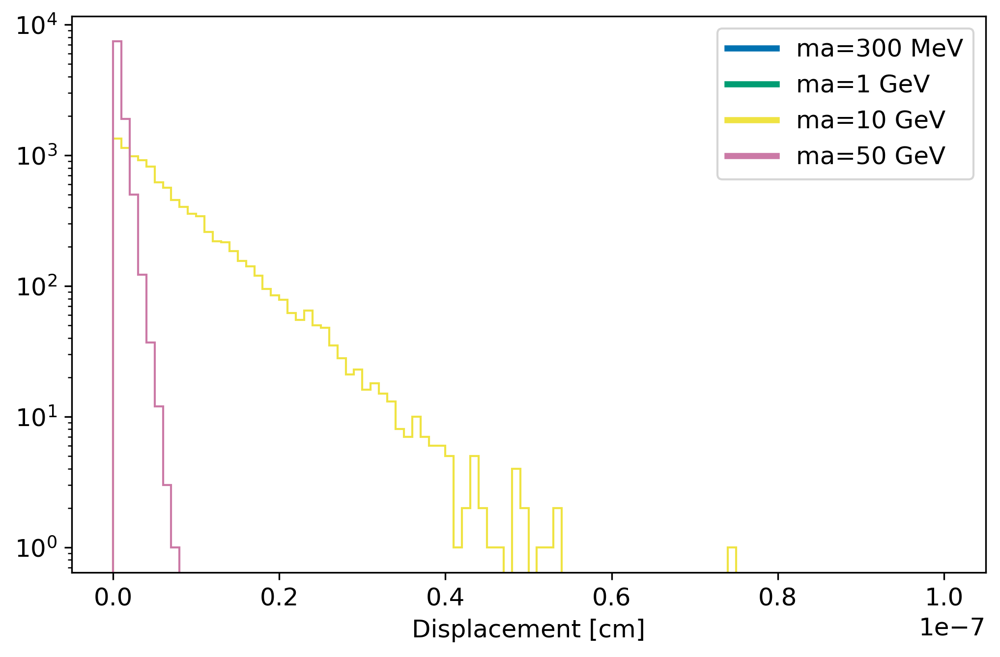

In [145]:
binList = np.arange(0,1e-7,1e-7/100)

colors = [(0/256, 114/256, 178/256, 1),(0/256, 158/256, 115/256, 1),(240/256, 228/256, 66/256, 1),(204/256, 121/256, 167/256, 1)]
handles = [Line2D([],[],c=colors[0],lw=3),Line2D([],[],c=colors[1],lw=3),Line2D([],[],c=colors[2],lw=3),Line2D([],[],c=colors[3],lw=3)]
labelList = ['ma=300 MeV', 'ma=1 GeV', 'ma=10 GeV', 'ma=50 GeV']

plt.hist(ctau_0p3,color=colors[0],bins=binList,histtype='step')
plt.hist(ctau_1,color=colors[1],bins=binList,histtype='step')
plt.hist(ctau_10,color=colors[2],bins=binList,histtype='step')
plt.hist(ctau_50,color=colors[3],bins=binList,histtype='step')
plt.legend(handles,labelList)
plt.xlabel("Displacement [cm]")
plt.yscale('log')